In [ ]:
# import argparse - omitted for notebook
import httpx
import json
import logging
import matplotlib.pyplot as plt
#import networkx as nx - omitted for nx-cugraph, see step 3.0
import os
import numpy as np
import pandas as pd
import pickle
import re
import seaborn as sns
import sys
import time
import warnings

from collections import defaultdict, deque, Counter
from datetime import datetime
from matplotlib_venn import venn2, venn3
from multiprocessing import Pool, cpu_count
from pathlib import Path
from types import SimpleNamespace
from urllib.request import urlopen
from tqdm import tqdm

### Step 1 - Collect Power Player (PP) Ground Truth names from ICIJ Website

In [ ]:
ground_truth_url= "https://offshoreleaks.icij.org/power-players"

with urlopen(ground_truth_url) as response:
    raw_html = response.read().decode('utf-8')

pattern = r'<div class="power-players__main__power-player__link__subtitle text-uppercase">\s*(.*?)\s*</div>'

matches = re.findall(pattern, raw_html, re.S)

# Strip extra spaces and collect in list
GROUND_TRUTH_NAMES = [match.strip() for match in matches]

with open("names.pkl", "wb") as f:
    pickle.dump(GROUND_TRUTH_NAMES, f)

### Step 1.5 - Collect Raw DB from ICIJ

In [ ]:
data_url = "https://offshoreleaks-data.icij.org/offshoreleaks/csv/full-oldb.LATEST.zip"

DATA_DIR = Path("data")
DATA_DIR.mkdir(exist_ok=True)
!wget -O data/data.zip "https://offshoreleaks-data.icij.org/offshoreleaks/csv/full-oldb.LATEST.zip"
!unzip -o data/data.zip -d data

##### SKIP TO THIS CELL: TA's / reviewers are invited to skip several of these steps by fetching and loading pre-populated documents from gh

This will give you the names from Step 1, though the raw CSV's are necessary from step 1.5 if you actually want to run much of the codebase

In [ ]:
gh_base_url = "https://raw.githubusercontent.com/dedelstein/social_graphs/main/Final_Proj/"

In [ ]:
!wget -O names.pkl "https://raw.githubusercontent.com/dedelstein/social_graphs/main/Final_Proj/names.pkl"

with urlopen(f"{gh_base_url}names.pkl") as response:
    GROUND_TRUTH_NAMES = pickle.load(response)

This will give you the data from Step 2-2.5

In [ ]:
!wget -O ground_truth_ids.pkl "https://raw.githubusercontent.com/dedelstein/social_graphs/main/Final_Proj/ground_truth_ids.pkl"

with urlopen(f"{gh_base_url}ground_truth_ids.pkl") as response:
    ground_truth_ids = pickle.load(response)

### Step 2 - Match (some) PP names to entity numbers in raw data

NB! the ICIJ API is severely rate limited.  This may (and probably will) time out during step 1.  We had to be very patient and run over the course of ~1 hr.  Runner Beware.

In [ ]:
"""
Build ground truth ID mapping in multiple stages:
1. ICIJ Reconciliation API (searches all datasets)
2. Local CSV exact match
3. Local CSV partial match (conservative)
4. Local CSV token match (only as last resort with strict requirements)
"""
# Track results
ground_truth_ids = {}  # gt_name -> (node_id, matched_name, node_type, source)
stage_stats = defaultdict(int)

# Load existing results if available - this was used for interuppted runs due to API rate limits
existing_file = 'ground_truth_ids.pkl'
if Path(existing_file).exists():
    print(f"Found existing {existing_file}, loading previous results...")
    with open(existing_file, 'rb') as f:
        existing_ids = pickle.load(f)

    for name, node_id in existing_ids.items():
        if name in GROUND_TRUTH_NAMES:
            ground_truth_ids[name] = (node_id, 'Previously found', 'unknown', 'Loaded from file')
            stage_stats['loaded_from_file'] += 1

    print(f"Loaded {len(ground_truth_ids)} previously found IDs")
    print(f"Need to find {len(GROUND_TRUTH_NAMES) - len(ground_truth_ids)} remaining names\n")
else:
    print(f"Need to find {len(GROUND_TRUTH_NAMES)} ground truth names\n")

# STAGE 1: ICIJ Reconciliation API
DATASETS = [
    "panama-papers",
    "paradise-papers",
    "pandora-papers",
    "bahamas-leaks",
    "offshore-leaks",
]

BASE_URL = "https://offshoreleaks.icij.org/api/v1/reconcile"

NODE_TYPES = [
    "https://offshoreleaks.icij.org/schema/oldb/officer",
    "https://offshoreleaks.icij.org/schema/oldb/entity",
    "https://offshoreleaks.icij.org/schema/oldb/intermediary",
    "https://offshoreleaks.icij.org/schema/oldb/address",
]

def search_reconcile_api(query, client, rate_limit_hit):
    """Search reconciliation API across all datasets and node types"""
    all_matches = []

    for dataset in DATASETS:
        url = f"{BASE_URL}/{dataset}"

        for node_type in NODE_TYPES:
            try:
                payload = {
                    "queries": {
                        "q1": {
                            "query": query,
                            "type": node_type
                        }
                    }
                }

                response = client.post(url, json=payload, timeout=15.0)
                data = response.json().get("q1", {}).get("result", [])

                # Only keep TRUE matches (match: True flag from API)
                true_matches = [
                    {
                        'id': item.get('id'),
                        'name': item.get('name'),
                        'score': item.get('score'),
                        'dataset': dataset,
                        'node_type': node_type.split('/')[-1]
                    }
                    for item in data
                    if item.get('match') is True
                ]

                all_matches.extend(true_matches)

            except Exception as e:
                error_str = str(e)
                # Check if this is a rate limit error (empty JSON response)
                if "Expecting value: line 1 column 1" in error_str:
                    rate_limit_hit[0] = True
                    print("\n RATE LIMIT HIT - Stopping API search")
                    return all_matches
                pass

    return all_matches


try:
    rate_limit_hit = [False]  # Use list so it's mutable in nested function

    with httpx.Client(timeout=20.0) as client:
        for gt_name in tqdm(GROUND_TRUTH_NAMES, desc="API search"):
            # Check if rate limit was hit - don't bother continuing
            if rate_limit_hit[0]:
                break
            if gt_name in ground_truth_ids:
                continue

            try:
                matches = search_reconcile_api(gt_name, client, rate_limit_hit)

                # Check again in case rate limit was hit during this call
                if rate_limit_hit[0]:
                    break

                if matches:
                    # Sort by score and take best match
                    matches.sort(key=lambda x: x['score'], reverse=True)
                    best = matches[0]

                    ground_truth_ids[gt_name] = (
                        best['id'],
                        best['name'],
                        best['node_type'],
                        f"API:{best['dataset']}"
                    )
                    stage_stats['stage1_api'] += 1
                    print(f"API MATCH: {gt_name} -> {best['name']} (ID: {best['id']}, score: {best['score']})")

                time.sleep(30.0)  # Long delay to avoid rate limits

            except Exception as e:
                print(f"X - API error for {gt_name}: {e}")
                pass

except Exception as e:
    print(f"Warning: API search failed ({e}). Continuing with CSV search...")

print(f"\nStage 1 complete: Found {stage_stats['stage1_api']} via API")

# STAGE 2: Local CSV - Exact Match

csv_files = [
    ('nodes-officers.csv', 'name', 'officer'),
    ('nodes-entities.csv', 'name', 'entity'),
    ('nodes-intermediaries.csv', 'name', 'intermediary'),
    ('nodes-addresses.csv', 'address', 'address'),
    ('nodes-others.csv', 'name', 'other')
]

for csv_file, name_column, node_type in csv_files:
    print(f"\nSearching {csv_file}...")
    df = pd.read_csv(DATA_DIR / csv_file, low_memory=False)
    df['name_upper'] = df[name_column].fillna('').str.upper()

    for gt_name in tqdm(GROUND_TRUTH_NAMES, desc=f"Exact match {node_type}", leave=False):
        if gt_name in ground_truth_ids:
            continue

        gt_name_upper = gt_name.upper()

        # Exact match only
        exact_match = df[df['name_upper'] == gt_name_upper]
        if not exact_match.empty:
            row = exact_match.iloc[0]
            ground_truth_ids[gt_name] = (
                row['node_id'],
                row[name_column],
                node_type,
                f"CSV-exact:{csv_file}"
            )
            stage_stats['stage2_exact'] += 1
            print(f"EXACT MATCH: {gt_name} -> {row[name_column]}")

print(f"\nStage 2 complete: Found {stage_stats['stage2_exact']} exact matches")

# STAGE 3: Local CSV - Partial Match (Conservative)
# Names to completely skip (too many false positives)
SKIP_NAMES = {
    'Queen Elizabeth II',  # Too many streets, hospitals, institutions with this name
}

PARTIAL_MATCH_BLACKLIST = {
    'Queen Elizabeth II': ['QUEEN ELIZABETH II STREET', 'QUEEN ELIZABETH HOSPITAL'],  # Street name, not the person
}

for csv_file, name_column, node_type in csv_files:
    print(f"\nSearching {csv_file}...")
    df = pd.read_csv(DATA_DIR / csv_file, low_memory=False)
    df['name_upper'] = df[name_column].fillna('').str.upper()

    for gt_name in tqdm(GROUND_TRUTH_NAMES, desc=f"Partial match {node_type}", leave=False):
        if gt_name in ground_truth_ids or gt_name in SKIP_NAMES:
            continue

        gt_name_upper = gt_name.upper()

        # Partial match: ground truth name appears in database name
        # Must be longer than 5 characters to avoid false positives
        if len(gt_name_upper) >= 6:
            partial_match = df[df['name_upper'].str.contains(gt_name_upper, na=False, regex=False)]
            if not partial_match.empty:
                row = partial_match.iloc[0]
                matched_name = row[name_column]

                # Check blacklist
                if gt_name in PARTIAL_MATCH_BLACKLIST:
                    blacklist_terms = PARTIAL_MATCH_BLACKLIST[gt_name]
                    matched_upper = str(matched_name).upper()
                    if any(term in matched_upper for term in blacklist_terms):
                        print(f"BLACKLISTED: {gt_name} -> {matched_name}")
                        continue

                ground_truth_ids[gt_name] = (
                    row['node_id'],
                    matched_name,
                    node_type,
                    f"CSV-partial:{csv_file}"
                )
                stage_stats['stage3_partial'] += 1
                print(f"   PARTIAL: {gt_name} -> {matched_name}")

print(f"\nStage 3 complete: Found {stage_stats['stage3_partial']} partial matches")

# STAGE 4: Local CSV - Token Match (Last Resort, Very Strict)
# Common words to exclude from token matching
COMMON_WORDS = {'AND', 'THE', 'OF', 'IN', 'FOR', 'TO', 'A', 'AN', 'S.A.', 'LTD',
                'LIMITED', 'INC', 'CORP', 'LLC', 'CO', 'GROUP', 'FAMILY'}

for csv_file, name_column, node_type in csv_files:
    print(f"\nSearching {csv_file}...")
    df = pd.read_csv(DATA_DIR / csv_file, low_memory=False)
    df['name_upper'] = df[name_column].fillna('').str.upper()

    for gt_name in tqdm(GROUND_TRUTH_NAMES, desc=f"Token match {node_type}", leave=False):
        if gt_name in ground_truth_ids:
            continue

        gt_name_upper = gt_name.upper()

        # Extract tokens (words longer than 3 chars, excluding common words)
        gt_tokens = set(gt_name_upper.split())
        gt_tokens = {t for t in gt_tokens if len(t) > 3 and t not in COMMON_WORDS}
        if len(gt_tokens) < 2:
            continue
        # Try to find rows where ALL significant tokens appear
        mask = pd.Series([True] * len(df))
        for token in gt_tokens:
            mask &= df['name_upper'].str.contains(token, na=False, regex=False)

        token_matches = df[mask]
        if not token_matches.empty:
            row = token_matches.iloc[0]
            ground_truth_ids[gt_name] = (
                row['node_id'],
                row[name_column],
                node_type,
                f"CSV-token:{csv_file}"
            )
            stage_stats['stage4_token'] += 1
            print(f"TOKEN-ALL Match: {gt_name} -> {row[name_column]} (matched all: {gt_tokens})")

print(f"\nStage 4 complete: Found {stage_stats['stage4_token']} token matches")

# STAGE 5: Local CSV - Last Name Match (Very Flexible, Manual Review)
# Ask user if they want to proceed with Stage 5
remaining = len([n for n in GROUND_TRUTH_NAMES if n not in ground_truth_ids and n not in SKIP_NAMES])
print(f"\n{remaining} names still missing.")
print("Stage 5 will search by last name only - this may produce false positives.")
response = input("\nProceed with Stage 5? (y/n): ").strip().lower()
if response != 'y':
    print("Skipping Stage 5...")
    stage_stats['stage5_lastname'] = 0
else:
    # Extract last names from remaining names
    def extract_last_name(full_name):
        """Extract likely last name from full name"""
        # Skip family/group names
        if any(word in full_name.lower() for word in ['family', 'children', 'and ', ' & ']):
            return None

        parts = full_name.strip().split()
        if len(parts) == 0:
            return None

        # Common patterns
        # Handle "bin/ibn" pattern (Arabic names) - use the part after last bin/ibn
        if 'bin' in parts or 'ibn' in parts:
            # Find last occurrence of bin/ibn and take next word
            for i in range(len(parts) - 1, -1, -1):
                if parts[i].lower() in ['bin', 'ibn']:
                    if i + 1 < len(parts):
                        return parts[i + 1]
            return parts[-1]  # Fallback

        # Handle "de/da/van/von" pattern - include the particle
        if len(parts) >= 2 and parts[-2].lower() in ['de', 'da', 'van', 'von', 'del', 'di']:
            return ' '.join(parts[-2:])
        return parts[-1]

    for csv_file, name_column, node_type in csv_files:
        print(f"\nSearching {csv_file}...")
        df = pd.read_csv(DATA_DIR / csv_file, low_memory=False)
        df['name_upper'] = df[name_column].fillna('').str.upper()

        for gt_name in tqdm(GROUND_TRUTH_NAMES, desc=f"Last name {node_type}", leave=False):
            if gt_name in ground_truth_ids or gt_name in SKIP_NAMES:
                continue

            last_name = extract_last_name(gt_name)
            if not last_name or len(last_name) < 4:
                continue

            last_name_upper = last_name.upper()
            last_name_match = df[df['name_upper'].str.contains(last_name_upper, na=False, regex=False)]
            if not last_name_match.empty:
                row = last_name_match.iloc[0]
                print("     LASTNAME MATCH FOUND:")
                print(f"     Ground truth: {gt_name}")
                print(f"     Last name: {last_name}")
                print(f"     Database match: {row[name_column]}")
                print(f"     Node ID: {row['node_id']}")
                print(f"     Type: {node_type}")

                response = input("     Accept this match? (y/n/s to skip all remaining): ").strip().lower()

                if response == 's':
                    print("     Skipping all remaining Stage 5 matches...")
                    break
                elif response == 'y':
                    ground_truth_ids[gt_name] = (
                        row['node_id'],
                        row[name_column],
                        node_type,
                        f"CSV-lastname:{csv_file}"
                    )
                    stage_stats['stage5_lastname'] += 1
                    print("      ACCEPTED")
                    break  # Found, move to next name
                else:
                    print("      REJECTED")
                    # Continue searching other CSV files

print(f"\nStage 5 complete: Found {stage_stats['stage5_lastname']} last name matches")
print("Stage 5 matches should be manually reviewed for accuracy!")

# SUMMARY
print("FINAL SUMMARY")
print(f"Total ground truth names: {len(GROUND_TRUTH_NAMES)}")
print(f"Successfully found: {len(ground_truth_ids)}")
print(f"Still missing: {len(GROUND_TRUTH_NAMES) - len(ground_truth_ids)}")

print("\nBreakdown by stage:")
if stage_stats.get('loaded_from_file'):
    print(f"  Loaded from file: {stage_stats['loaded_from_file']}")
print(f"  Stage 1 (API): {stage_stats['stage1_api']}")
print(f"  Stage 2 (Exact): {stage_stats['stage2_exact']}")
print(f"  Stage 3 (Partial): {stage_stats['stage3_partial']}")
print(f"  Stage 4 (Token): {stage_stats['stage4_token']}")
print(f"  Stage 5 (Last Name): {stage_stats['stage5_lastname']}")

# Find missing names
missing_names = [name for name in GROUND_TRUTH_NAMES if name not in ground_truth_ids]

if missing_names:
    print(f"MISSING NAMES ({len(missing_names)}):")
    for name in sorted(missing_names):
        print(f"  - {name}")

# SAVE RESULTS

# Save as pickle (node_id only)
node_id_dict = {name: data[0] for name, data in ground_truth_ids.items()}
with open('ground_truth_ids.pkl', 'wb') as f:
    pickle.dump(node_id_dict, f)
print(f" Saved node IDs to ground_truth_ids.pkl ({len(node_id_dict)} IDs)")

# Save full details as JSON for manual review
output_json = {
    'ground_truth_ids': {
        name: {
            'node_id': str(data[0]),  # Convert to string for JSON
            'matched_name': str(data[1]),
            'node_type': str(data[2]),
            'source': str(data[3])
        }
        for name, data in ground_truth_ids.items()
    },
    'missing': missing_names,
    'summary': {
        'total': len(GROUND_TRUTH_NAMES),
        'found': len(ground_truth_ids),
        'missing': len(missing_names),
        'stage_breakdown': dict(stage_stats)
    }
}

with open('ground_truth_ids_full.json', 'w') as f:
    json.dump(output_json, f, indent=2)

# Save human-readable text report for manual review
with open('ground_truth_ids_report.txt', 'w') as f:
    f.write("Ground Truth ID Mapping - Full Report\n")

    f.write(f"Total: {len(GROUND_TRUTH_NAMES)}\n")
    f.write(f"Found: {len(ground_truth_ids)}\n")
    f.write(f"Missing: {len(missing_names)}\n\n")

    f.write("FOUND NAMES:\n")
    for gt_name in sorted(ground_truth_ids.keys()):
        node_id, matched_name, node_type, source = ground_truth_ids[gt_name]
        f.write(f"\n{gt_name}\n")
        f.write(f"  -> {matched_name}\n")
        f.write(f"  -> ID: {node_id}\n")
        f.write(f"  -> Type: {node_type}\n")
        f.write(f"  -> Source: {source}\n")

    if missing_names:
        f.write("MISSING NAMES:\n")
        f.write("-"*70 + "\n")
        for name in sorted(missing_names):
            f.write(f"  - {name}\n")

print("Saved report to ground_truth_ids_report.txt")

print(f"Successfully mapped {len(ground_truth_ids)} out of {len(GROUND_TRUTH_NAMES)} ground truth names")
if len(ground_truth_ids) == len(GROUND_TRUTH_NAMES):
    print("ALL GROUND TRUTH NAMES FOUND!")
else:
    print(f"Still need to find {len(missing_names)} names manually")

### Step 2.5 - Match manually annotated PP names and synchronize with ground truth

If you want to run this, you will need to fetch the manual annotation file

In [ ]:
!wget -O ./name_manual.txt "https://raw.githubusercontent.com/dedelstein/social_graphs/main/Final_Proj/name_manual.txt"

In [ ]:
gt_file = 'ground_truth_ids.pkl'

# If resuming from existing file
with open(gt_file, 'rb') as f:
    ground_truth_ids = pickle.load(f)

print(f"Loaded {len(ground_truth_ids)} existing IDs")

# Parse name_manual.txt
print("\nParsing name_manual.txt...")
added = 0
skipped = 0
excluded = []

with open('name_manual.txt', 'r') as f:
    for line in f:
        line = line.strip()

        if not line or line.startswith('='):
            continue

        # Handle exclusions (X- prefix) - these are PP names found to be innappropriate for research
        if line.startswith('X-'):
            name = line[3:].strip()
            excluded.append(name)
            print(f"  X EXCLUDE: {name}")
            continue

        # Parse ID(s) and name
        if ' - ' in line:
            ids_part, name = line.split(' - ', 1)
            ids = [id.strip() for id in ids_part.split(',')]

            # Use first ID (primary one)
            primary_id = ids[0]

            # Add to ground truth
            ground_truth_ids[name] = primary_id
            added += 1

            if len(ids) > 1:
                print(f"  + {name}: {primary_id} (also: {', '.join(ids[1:])})")
            else:
                print(f"  + {name}: {primary_id}")

print(f"\nAdded {added} manual IDs")
print(f"Excluded {len(excluded)} names")

# Remove excluded names if they exist
for name in excluded:
    if name in ground_truth_ids:
        del ground_truth_ids[name]
        print(f"  Removed: {name}")

# Save updated file
with open(gt_file, 'wb') as f:
    pickle.dump(ground_truth_ids, f)

print(f"Saved {len(ground_truth_ids)} total IDs to {gt_file}")

original_count = len(GROUND_TRUTH_NAMES)
all_names = [name for name in GROUND_TRUTH_NAMES if name not in excluded]
removed = original_count - len(all_names)

print(f"Now have {len(all_names)} ground truth names total")

# Summary
print("SUMMARY")
print(f"Total ground truth names: {len(all_names)}")
print(f"IDs found: {len(ground_truth_ids)}")
print(f"Still missing: {len(all_names) - len(ground_truth_ids)}")

missing = [name for name in all_names if name not in ground_truth_ids]
if missing:
    print(f"\nStill missing ({len(missing)}):")
    for name in missing:
        print(f"  - {name}")

#### NB! You can run the code blocks earlier in the notebook indicated as "SKIP TO THIS CELL" and you will save yourself rate limited pain and slow csv processing

### Step 3.0 - Initial attempts at building a network.  NB, we did not use this in our final analysis outside broad overview

First you would need to install the nx-cugraph backend, mainly used in step 3.1
Also it is unclear if it would work in a jupyter notebook if you had already imported networkx

In [ ]:
!pip install nx-cugraph-cu13 --extra-index-url https://pypi.nvidia.com
%env NX_CUGRAPH_AUTOCONFIG=True
import networkx as nx

In [ ]:
"""
Panama Papers Network Builder - HPC Optimized Two-Phase Approach

Phase 1: Aggressive initial construction (depth 6, ~250K nodes)
Phase 2: Intelligent filtering to target size (~50K nodes) with centrality-based sampling
"""
NUM_CORES = cpu_count()

def setup_logging(log_file):
    """Setup logging configuration"""
    logging.basicConfig(
        level=logging.INFO,
        format='%(asctime)s - %(levelname)s - %(message)s',
        handlers=[
            logging.FileHandler(log_file),
            logging.StreamHandler(sys.stdout)
        ]
    )
    return logging.getLogger(__name__)

def load_single_node_csv(node_type, file_name):
    """Load a single node CSV file and return processed data"""
    df = pd.read_csv(DATA_DIR / file_name, low_memory=False, dtype={'node_id': str})

    node_dict = {}

    if node_type == 'entity':
        for _, row in tqdm(df.iterrows(), total=len(df), desc=f"Processing {node_type}", leave=False):
            node_dict[row['node_id']] = {
                'name': row['name'],
                'node_type': 'entity',
                'countries': row.get('countries', ''),
                'jurisdiction': row.get('jurisdiction', ''),
                'sourceID': row.get('sourceID', '')
            }
    elif node_type == 'officer':
        for _, row in tqdm(df.iterrows(), total=len(df), desc=f"Processing {node_type}", leave=False):
            node_dict[row['node_id']] = {
                'name': row['name'],
                'node_type': 'officer',
                'countries': row.get('countries', ''),
                'sourceID': row.get('sourceID', '')
            }
    elif node_type == 'intermediary':
        for _, row in tqdm(df.iterrows(), total=len(df), desc=f"Processing {node_type}", leave=False):
            node_dict[row['node_id']] = {
                'name': row['name'],
                'node_type': 'intermediary',
                'countries': row.get('countries', ''),
                'sourceID': row.get('sourceID', '')
            }
    elif node_type == 'address':
        for _, row in tqdm(df.iterrows(), total=len(df), desc=f"Processing {node_type}", leave=False):
            node_dict[row['node_id']] = {
                'name': row.get('address', 'Unknown Address'),
                'node_type': 'address',
                'countries': row.get('countries', ''),
                'sourceID': row.get('sourceID', '')
            }
    elif node_type == 'other':
        for _, row in tqdm(df.iterrows(), total=len(df), desc=f"Processing {node_type}", leave=False):
            node_dict[row['node_id']] = {
                'name': row.get('name', 'Unknown'),
                'node_type': 'other',
                'countries': row.get('countries', ''),
                'sourceID': row.get('sourceID', '')
            }

    return node_type, node_dict, df if node_type == 'officer' else None

def load_node_data(logger):
    """Load all node CSVs in parallel and create lookup dictionaries"""
    logger.info(f"Loading node data using {NUM_CORES} CPU cores...")

    node_files = [
        ('entity', 'nodes-entities.csv'),
        ('officer', 'nodes-officers.csv'),
        ('intermediary', 'nodes-intermediaries.csv'),
        ('address', 'nodes-addresses.csv'),
        ('other', 'nodes-others.csv')
    ]

    logger.info("Loading and processing CSV files in parallel...")
    with Pool(processes=min(5, NUM_CORES)) as pool:
        results = pool.starmap(load_single_node_csv, node_files)

    node_data = {}
    officers_df = None

    for node_type, node_dict, df in results:
        logger.info(f"Processing {len(node_dict)} {node_type} nodes...")
        node_data.update(node_dict)
        if node_type == 'officer':
            officers_df = df

    logger.info(f"Loaded {len(node_data)} total nodes")

    return node_data, officers_df

def process_relationship_chunk(chunk_data):
    """Process a chunk of relationships and return adjacency lists"""
    adjacency_out = {}
    adjacency_in = {}

    for _, row in tqdm(chunk_data.iterrows(), total=len(chunk_data), desc="Processing chunk", leave=False):
        source = row['node_id_start']
        target = row['node_id_end']
        rel_type = row['rel_type']

        if source not in adjacency_out:
            adjacency_out[source] = []
        adjacency_out[source].append((target, rel_type))

        if target not in adjacency_in:
            adjacency_in[target] = []
        adjacency_in[target].append((source, rel_type))

    return adjacency_out, adjacency_in

def build_network_bfs(relationships_file, ground_truth_ids, node_data,
                      max_nodes, max_depth, logger):
    """Build network using BFS expansion from ground truth nodes

    Note: NetworkX DiGraph automatically prevents duplicate nodes and edges.
    max_nodes=0 means unlimited (explore to max_depth without node limit).
    """
    logger.info("PHASE 1: INITIAL NETWORK CONSTRUCTION")
    logger.info(f"Max nodes: {'UNLIMITED' if max_nodes == 0 else max_nodes}")
    logger.info(f"Max depth: {max_depth}")
    logger.info(f"Starting from {len(ground_truth_ids)} ground truth nodes")

    G = nx.DiGraph()

    # Set effective max_nodes (0 = unlimited)
    effective_max_nodes = float('inf') if max_nodes == 0 else max_nodes

    # Load relationships and build adjacency lists using parallel processing
    logger.info(f"Loading relationships from CSV using {NUM_CORES} CPU cores...")
    chunk_size = 500000
    adjacency_out = {}  # node -> [(target, rel_type), ...]
    adjacency_in = {}   # node -> [(source, rel_type), ...]

    logger.info("Reading relationship chunks...")
    chunks = list(tqdm(pd.read_csv(relationships_file, chunksize=chunk_size, low_memory=False,
                                     dtype={'node_id_start': str, 'node_id_end': str}),
                       desc="Loading chunks"))

    # Process chunks in parallel
    logger.info(f"Processing {len(chunks)} chunks in parallel...")
    with Pool(processes=NUM_CORES) as pool:
        results = list(tqdm(pool.imap(process_relationship_chunk, chunks),
                           total=len(chunks),
                           desc="Processing relationships"))

    logger.info("Merging adjacency lists...")
    total_relationships = 0
    for adj_out, adj_in in tqdm(results, desc="Merging"):
        for source, targets in adj_out.items():
            if source not in adjacency_out:
                adjacency_out[source] = []
            adjacency_out[source].extend(targets)
            total_relationships += len(targets)

        for target, sources in adj_in.items():
            if target not in adjacency_in:
                adjacency_in[target] = []
            adjacency_in[target].extend(sources)

    logger.info(f"Loaded {total_relationships} total relationships")
    logger.info(f"Nodes with outgoing edges: {len(adjacency_out)}")
    logger.info(f"Nodes with incoming edges: {len(adjacency_in)}")

    logger.info("\nExpanding network with BFS...")
    visited = set()
    queue = deque([(node_id, 0) for node_id in ground_truth_ids])

    for node_id in ground_truth_ids:
        visited.add(node_id)

    depth_stats = Counter()

    edges_to_add = [] # Collect edges separately - add them only after both endpoints are in graph

    pbar = tqdm(total=None if max_nodes == 0 else max_nodes, desc="Building network")

    with pbar:
        while queue and len(G.nodes()) < effective_max_nodes:
            current_node, depth = queue.popleft()

            if current_node in G:
                continue

            if current_node not in node_data:
                continue

            G.add_node(current_node, **node_data[current_node], depth=depth)
            depth_stats[depth] += 1
            pbar.update(1)

            if depth >= max_depth:
                continue

            if current_node in adjacency_out: # Collect outgoing edges and enqueue neighbors
                for target, rel_type in adjacency_out[current_node]:
                    if target in node_data:
                        edges_to_add.append((current_node, target, rel_type))

                        if target not in visited and len(G.nodes()) < effective_max_nodes:
                            visited.add(target)
                            queue.append((target, depth + 1))

            if current_node in adjacency_in:
                for source, rel_type in adjacency_in[current_node]:
                    if source in node_data:
                        edges_to_add.append((source, current_node, rel_type))

                        if source not in visited and len(G.nodes()) < effective_max_nodes:
                            visited.add(source)
                            queue.append((source, depth + 1))

    logger.info(f"\nAdding edges (total collected: {len(edges_to_add)})...")
    edges_added = 0
    for source, target, rel_type in tqdm(edges_to_add, desc="Adding edges"):
        if source in G and target in G:
            G.add_edge(source, target, rel_type=rel_type)
            edges_added += 1

    logger.info(f"Added {edges_added} edges ({len(edges_to_add) - edges_added} skipped due to missing endpoints)")

    logger.info(f"\nBuilt network with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges")
    logger.info(f"Depth distribution: {dict(depth_stats)}")

    unique_nodes = len(set(G.nodes()))
    unique_edges = len(set(G.edges()))
    logger.info(f"  Unique nodes: {unique_nodes} (total: {G.number_of_nodes()}) - OK")
    logger.info(f"  Unique edges: {unique_edges} (total: {G.number_of_edges()}) - OK")

    return G

def get_largest_connected_component(G, logger):
    """Extract largest connected component from directed graph"""
    logger.info("\nExtracting largest connected component...")

    # For directed graphs, use weakly connected components
    components = list(nx.weakly_connected_components(G))
    components.sort(key=len, reverse=True)

    logger.info(f"Found {len(components)} weakly connected components")
    logger.info(f"Top 5 component sizes: {[len(c) for c in components[:5]]}")

    # Get LCC
    lcc_nodes = components[0]
    G_lcc = G.subgraph(lcc_nodes).copy(as_view=True)

    logger.info(f"LCC: {G_lcc.number_of_nodes()} nodes, {G_lcc.number_of_edges()} edges")

    return G_lcc

def print_network_stats(G, name, logger):
    """Print comprehensive network statistics"""
    logger.info(f"{name} Statistics")
    logger.info(f"Nodes: {G.number_of_nodes():,}")
    logger.info(f"Edges: {G.number_of_edges():,}")
    logger.info(f"Density: {nx.density(G):.8f}")

    # Node type distribution
    node_types = Counter()
    for _, attrs in G.nodes(data=True):
        node_types[attrs.get('node_type', 'unknown')] += 1

    logger.info("\nNode type distribution:")
    for nt, count in sorted(node_types.items(), key=lambda x: x[1], reverse=True):
        logger.info(f"  {nt}: {count:,} ({100*count/G.number_of_nodes():.1f}%)")

    # Edge type distribution
    edge_types = Counter()
    for _, _, attrs in G.edges(data=True):
        edge_types[attrs.get('rel_type', 'unknown')] += 1

    logger.info("\nTop 10 relationship types:")
    for et, count in sorted(edge_types.items(), key=lambda x: x[1], reverse=True)[:10]:
        logger.info(f"  {et}: {count:,} ({100*count/G.number_of_edges():.1f}%)")

    # Degree statistics
    if G.number_of_nodes() > 0:
        if G.is_directed():
            in_degrees = [d for n, d in G.in_degree()]
            out_degrees = [d for n, d in G.out_degree()]
            logger.info(f"\nIn-degree - Min: {min(in_degrees)}, Max: {max(in_degrees)}, "
                       f"Mean: {np.mean(in_degrees):.2f}, Median: {np.median(in_degrees):.2f}")
            logger.info(f"Out-degree - Min: {min(out_degrees)}, Max: {max(out_degrees)}, "
                       f"Mean: {np.mean(out_degrees):.2f}, Median: {np.median(out_degrees):.2f}")
        else:
            degrees = [d for n, d in G.degree()]
            logger.info(f"\nDegree - Min: {min(degrees)}, Max: {max(degrees)}, "
                       f"Mean: {np.mean(degrees):.2f}, Median: {np.median(degrees):.2f}")

def phase1_initial_construction(args, logger):
    """Phase 1: Build large initial network"""
    node_data, _ = load_node_data(logger)

    logger.info("Loading ground truth IDs from ground_truth_ids.pkl...")
    with open('ground_truth_ids.pkl', 'rb') as f:
        ground_truth_id_dict = pickle.load(f)

    logger.info(f"Loaded {len(ground_truth_id_dict)} ground truth IDs")

    ground_truth_ids = []
    found_mapping = []
    missing_ids = []

    for gt_name, node_id in ground_truth_id_dict.items():
        node_id_str = str(node_id)

        if node_id_str in node_data:
            ground_truth_ids.append(node_id_str)
            canonical_name = node_data[node_id_str]['name']
            node_type = node_data[node_id_str]['node_type']
            found_mapping.append((gt_name, canonical_name, node_type, node_id_str))
            logger.info(f"   {gt_name} -> {canonical_name} ({node_type}, ID: {node_id_str})")
        else:
            missing_ids.append((gt_name, node_id_str))
            logger.warning(f"{gt_name}: ID {node_id_str} not found in node_data")

    logger.info(f"\nSuccessfully loaded {len(ground_truth_ids)} ground truth nodes")
    if missing_ids:
        logger.warning(f"WARNING: {len(missing_ids)} IDs not found in CSV data")

    # Save ground truth mapping
    mapping_file = 'ground_truth_mapping.txt'
    with open(mapping_file, 'w') as f:
        f.write("Ground Truth Name -> Canonical Name (Type, ID)\n")
        f.write("="*70 + "\n")
        for gt_name, canonical_name, node_type, node_id in found_mapping:
            f.write(f"{gt_name}\n")
            f.write(f"  -> {canonical_name}\n")
            f.write(f"  -> Type: {node_type}\n")
            f.write(f"  -> ID: {node_id}\n\n")
        if missing_ids:
            f.write(f"MISSING IDs ({len(missing_ids)}):\n")
            for gt_name, node_id in missing_ids:
                f.write(f"  {gt_name}: {node_id}\n")
    logger.info(f"Ground truth mapping saved to {mapping_file}")

    # Build network
    relationships_file = DATA_DIR / 'relationships.csv'
    G = build_network_bfs(
        relationships_file,
        ground_truth_ids,
        node_data,
        max_nodes=args.max_nodes,
        max_depth=args.max_depth,
        logger=logger
    )

    # Print stats
    print_network_stats(G, "Initial Network", logger)

    # Extract LCC
    G_lcc = get_largest_connected_component(G, logger)
    print_network_stats(G_lcc, "Largest Connected Component", logger)

    # Save networks
    logger.info("\nSaving networks...")
    if args.output:
        output_file = args.output
    else:
        node_label = 'unlimited' if args.max_nodes == 0 else str(args.max_nodes)
        output_file = f'panama_network_initial_{node_label}.pkl'

    lcc_file = output_file.replace('.pkl', '_lcc.pkl')

    logger.info(f"Saving initial network to {output_file}...")
    with open(output_file, 'wb') as f:
        pickle.dump(G, f, protocol=pickle.HIGHEST_PROTOCOL)
    logger.info(f"  Saved: {output_file}")

    logger.info(f"Saving LCC to {lcc_file}...")
    with open(lcc_file, 'wb') as f:
        pickle.dump(G_lcc, f, protocol=pickle.HIGHEST_PROTOCOL)
    logger.info(f"  Saved: {lcc_file}")

    return G, G_lcc


This code was originally written as a standalone python file to be run as follows:

`python build_network.py --max-nodes 0 --max-depth 6`

with max-nodes n as self explanatory, except that 0 meant unlimited

```
def main():
    parser = argparse.ArgumentParser(
        description='Panama Papers Network Builder - Two-Phase HPC Approach',
        formatter_class=argparse.RawDescriptionHelpFormatter,
        epilog="""
Examples:
    Build initial network:
    python build_network.py--max-nodes 250000 --max-depth 6
        """
    )

    parser.add_argument('--max-nodes', type=int, default=250000,
                       help='Maximum nodes for initial network (Phase 1)')
    parser.add_argument('--max-depth', type=int, default=6,
                       help='Maximum BFS depth (Phase 1)')
    parser.add_argument('--output', type=str,
                       help='Output file name (default: auto-generated)')
    parser.add_argument('--log-file', type=str,
                       default=f'network_builder_{datetime.now().strftime("%Y%m%d_%H%M%S")}.log',
                       help='Log file name')

    args = parser.parse_args()

    # Setup logging
    logger = setup_logging(args.log_file)
    logger.info("Panama Papers Network Builder")
    logger.info(f"Arguments: {vars(args)}")

    phase1_initial_construction(args, logger)

    logger.info("SUCCESS: Process completed")

if __name__ == "__main__":
    main()
```

In [ ]:
# Here is an adaptation to run the above code in this notebook environment
# ----- define arguments exactly as argparse would -----
args = SimpleNamespace(
    max_nodes=250000,
    max_depth=6,
    output=None,
    log_file=f'network_builder_{datetime.now().strftime("%Y%m%d_%H%M%S")}.log'
)

# ----- run the pipeline exactly as main() would -----
logger = setup_logging(args.log_file)
logger.info("Panama Papers Network Builder")
logger.info(f"Arguments: {vars(args)}")

phase1_initial_construction(args, logger)

logger.info("SUCCESS: Process completed")

### Step 3 - Actual Complex Subgraph Exploration
(This was what we used for our final research)

#### NB! This is a very compute intensive section, it was run as an overnight batch job on the DTU A100 HPC.  Jobscript included below.  Not advised to run unless that seems exciting to you

In [ ]:
"""
Full Network Thresholding Analysis Pipeline
============================================

Complete pipeline to:
1. Build full network from Panama Papers data with all metadata
2. Annotate Power Players
3. Compute centralities on full network
4. Apply systematic thresholding strategies
5. Compare subnetwork characteristics

Usage:
    python full_threshold_analysis.py --data-dir ./data
"""

# Enable cuGraph backend if available
os.environ["NX_CUGRAPH_AUTOCONFIG"] = "True"

# Suppress cuGraph cache warnings
warnings.filterwarnings('ignore', message='.*conversions to backend graphs.*')
nx.config.warnings_to_ignore.add("cache")


def load_or_compute(filepath, compute_fn, description, force_recompute=False):
    """Load from pickle if exists, otherwise compute and save"""
    filepath = Path(filepath)
    
    if filepath.exists() and not force_recompute:
        print(f"Loading cached {description} from {filepath}...")
        with open(filepath, 'rb') as f:
            return pickle.load(f)
    else:
        print(f"Computing {description}...")
        result = compute_fn()
        print(f"Saving {description} to {filepath}...")
        filepath.parent.mkdir(parents=True, exist_ok=True)
        with open(filepath, 'wb') as f:
            pickle.dump(result, f, protocol=pickle.HIGHEST_PROTOCOL)
        print(f"Saved: {filepath}")
        return result


def load_relationships(relationships_csv):
    """Load and aggregate relationships into weighted edges"""
    print("Loading relationships CSV...")
    df = pd.read_csv(relationships_csv, dtype=str, low_memory=False)
    
    print(f"Loaded {len(df):,} relationships")
    
    # Aggregate to weighted edges, keeping first rel_type and sourceID
    print("Aggregating edges (counting duplicates as weight)...")
    df_agg = (
        df.groupby(['node_id_start', 'node_id_end'])
        .agg({
            'rel_type': 'first',
            'sourceID': 'first',
            'node_id_start': 'size'  # count duplicates
        })
        .rename(columns={'node_id_start': 'weight'})
        .reset_index()
    )
    
    print(f"Aggregated to {len(df_agg):,} unique edges")
    return df_agg


def load_node_attributes(data_dir):
    """Load all node CSV files and create attribute dictionary"""
    node_files = {
        'entity': 'nodes-entities.csv',
        'officer': 'nodes-officers.csv',
        'intermediary': 'nodes-intermediaries.csv',
        'address': 'nodes-addresses.csv',
        'other': 'nodes-others.csv'
    }
    
    node_attrs = {}
    
    for node_type, filename in node_files.items():
        filepath = Path(data_dir) / filename
        if not filepath.exists():
            print(f"Warning: {filename} not found, skipping...")
            continue
            
        print(f"Loading {node_type} nodes from {filename}...")
        df = pd.read_csv(filepath, dtype=str, low_memory=False)
        
        print(f"  Processing {len(df):,} {node_type} nodes...")
        for _, row in tqdm(df.iterrows(), total=len(df), desc=f"  {node_type}", leave=False):
            node_id = str(row['node_id'])
            
            # Build attribute dict
            attrs = {
                'node_type': node_type,
                'name': row.get('name', row.get('address', 'Unknown')),
                'countries': row.get('countries', ''),
                'country_codes': row.get('country_codes', ''),
                'sourceID': row.get('sourceID', '')
            }
            
            # Add entity-specific attributes
            if node_type == 'entity':
                attrs.update({
                    'jurisdiction': row.get('jurisdiction', ''),
                    'jurisdiction_description': row.get('jurisdiction_description', ''),
                    'company_type': row.get('company_type', ''),
                    'status': row.get('status', '')
                })
            
            node_attrs[node_id] = attrs
    
    print(f"Loaded {len(node_attrs):,} total node attributes")
    return node_attrs


def build_full_graph(df_edges, node_attrs):
    """Build full undirected weighted graph with metadata"""
    print("\nBuilding full graph...")
    G = nx.Graph()
    
    print("Adding edges with attributes...")
    for _, row in tqdm(df_edges.iterrows(), total=len(df_edges), desc="Adding edges"):
        u = str(row['node_id_start'])
        v = str(row['node_id_end'])
        
        G.add_edge(
            u, v,
            weight=int(row['weight']),
            rel_type=row['rel_type'],
            sourceID=row['sourceID']
        )
    
    print(f"Graph built: {G.number_of_nodes():,} nodes, {G.number_of_edges():,} edges")
    
    # Add node attributes
    print("Adding node attributes...")
    nodes_with_attrs = 0
    for node in tqdm(G.nodes(), desc="Node attributes"):
        if node in node_attrs:
            G.nodes[node].update(node_attrs[node])
            nodes_with_attrs += 1
        else:
            # Default attributes for nodes without metadata
            G.nodes[node].update({
                'node_type': 'unknown',
                'name': f'Node_{node}',
                'countries': '',
                'sourceID': ''
            })
    
    print(f"Added attributes to {nodes_with_attrs:,} / {G.number_of_nodes():,} nodes")
    return G


def extract_lcc(G):
    """Extract largest connected component"""
    print("\nExtracting largest connected component...")
    components = list(nx.connected_components(G))
    components.sort(key=len, reverse=True)
    
    print(f"Found {len(components)} connected components")
    print(f"Top 5 component sizes: {[len(c) for c in components[:5]]}")
    
    lcc_nodes = components[0]
    G_lcc = G.subgraph(lcc_nodes).copy()
    
    print(f"LCC: {G_lcc.number_of_nodes():,} nodes ({100*len(lcc_nodes)/len(G):.1f}% of total)")
    print(f"     {G_lcc.number_of_edges():,} edges ({100*G_lcc.number_of_edges()/G.number_of_edges():.1f}% of total)")
    
    return G_lcc

def annotate_power_players(G, ground_truth_ids_file):
    """Annotate nodes that are Power Players"""
    print("\nAnnotating Power Players...")
    
    if not Path(ground_truth_ids_file).exists():
        print(f"Warning: {ground_truth_ids_file} not found. Skipping Power Player annotation.")
        # Add False for all nodes
        for node in G.nodes():
            G.nodes[node]['is_power_player'] = False
        return G, 0
    
    with open(ground_truth_ids_file, 'rb') as f:
        power_player_ids = pickle.load(f)
    
    # Convert to set of string IDs
    power_player_set = {str(node_id) for node_id in power_player_ids.values()}
    
    # Annotate
    power_players_found = 0
    for node in G.nodes():
        is_pp = (node in power_player_set)
        G.nodes[node]['is_power_player'] = is_pp
        if is_pp:
            power_players_found += 1
    
    print(f"Found {power_players_found} Power Players in network (out of {len(power_player_ids)} expected)")
    
    return G, power_players_found

# WARNING! THIS WILL BREAK YOUR COMPUTER IF YOU DONT HAVE A LARGE GPU WITH ENOUGH MEMORY
def compute_centralities(G, k_betweenness=1000):
    """Compute centrality measures on full network"""
    print("\nComputing centralities on full network...")
    print("This may take significant time for large graphs.")
    
    centralities = {}
    
    print("1/4 Computing degree centrality...")
    centralities['degree'] = dict(G.degree())
    
    print("2/4 Computing weighted degree...")
    centralities['weighted_degree'] = {
        n: sum(G[n][nbr]['weight'] for nbr in G[n])
        for n in tqdm(G.nodes(), desc="Weighted degree")
    }
    
    print(f"3/4 Computing PageRank (weight='weight')...")
    try:
        centralities['pagerank'] = nx.pagerank(G, weight='weight', max_iter=100)
    except Exception as e:
        print(f"PageRank failed: {e}")
        centralities['pagerank'] = {}
    
    print(f"4/4 Computing approximate betweenness (k={k_betweenness})...")
    try:
        centralities['betweenness'] = nx.betweenness_centrality(G, k=k_betweenness, seed=42, backend='cugraph')
    except Exception as e:
        print(f"Betweenness failed: {e}")
        centralities['betweenness'] = {}
    
    print("Centralities computed successfully.")
    return centralities

def threshold_by_weight(G, min_weight):
    """Keep edges with weight >= min_weight"""
    H = nx.Graph()
    
    for u, v, d in G.edges(data=True):
        if d.get('weight', 1) >= min_weight:
            H.add_edge(u, v, **d)
    
    # Add node attributes
    for n in H.nodes():
        if n in G.nodes:
            H.nodes[n].update(G.nodes[n])
    
    # Return LCC
    if len(H) == 0:
        return H
    
    lcc = max(nx.connected_components(H), key=len)
    return H.subgraph(lcc).copy()


def threshold_by_centrality_percentile(G, centrality_dict, percentile=90):
    """Keep nodes above percentile threshold"""
    if not centrality_dict:
        return nx.Graph()
    
    threshold_val = np.percentile(list(centrality_dict.values()), percentile)
    keep_nodes = {n for n, v in centrality_dict.items() if v >= threshold_val}
    
    H = G.subgraph(keep_nodes).copy()
    
    # Return LCC
    if len(H) == 0:
        return H
    
    lcc = max(nx.connected_components(H), key=len)
    return H.subgraph(lcc).copy()


def threshold_by_kcore(G, k):
    """Keep k-core (nodes with degree >= k in induced subgraph)"""
    try:
        return nx.k_core(G, k)
    except:
        return nx.Graph()

def threshold_by_ego_distance(G, max_distance=2):
    """Keep nodes within max_distance hops of any Power Player - optimized version"""
    power_players = [n for n in G.nodes() if G.nodes[n].get('is_power_player', False)]
    
    if not power_players:
        print(f"Warning: No Power Players found for ego network (distance={max_distance})")
        return nx.Graph()
    
    print(f"  Expanding from {len(power_players)} Power Players to distance {max_distance}...")
    
    # Clear NetworkX cache to avoid cuGraph overhead
    if hasattr(G, '__networkx_cache__'):
        G.__networkx_cache__.clear()
    
    # Use efficient batch BFS instead of calling ego_graph per node
    keep_nodes = set()
    
    # Build adjacency dict once for fast lookups
    adj_dict = {n: set(G.neighbors(n)) for n in power_players}
    
    for pp in tqdm(power_players, desc=f"  Ego-{max_distance}", leave=False):
        if pp not in G:
            continue
        
        # BFS from this power player
        visited = {pp}
        queue = deque([(pp, 0)])
        
        while queue:
            node, depth = queue.popleft()
            
            if depth < max_distance:
                # Get neighbors efficiently
                if node in adj_dict:
                    neighbors = adj_dict[node]
                else:
                    neighbors = set(G.neighbors(node))
                    adj_dict[node] = neighbors
                
                for neighbor in neighbors:
                    if neighbor not in visited:
                        visited.add(neighbor)
                        queue.append((neighbor, depth + 1))
        
        keep_nodes.update(visited)
    
    print(f"    Collected {len(keep_nodes):,} nodes")
    return G.subgraph(keep_nodes).copy()


def threshold_by_rel_type(G, keep_types):
    """Keep only edges with specified relationship types"""
    H = nx.Graph()
    
    for u, v, d in G.edges(data=True):
        if d.get('rel_type') in keep_types:
            H.add_edge(u, v, **d)
    
    # Add node attributes
    for n in H.nodes():
        if n in G.nodes:
            H.nodes[n].update(G.nodes[n])
    
    if len(H) == 0:
        return H
    
    lcc = max(nx.connected_components(H), key=len)
    return H.subgraph(lcc).copy()


def create_thresholded_subgraphs(G_full, centralities, output_dir):
    """Create multiple subgraphs using different thresholding strategies
    
    Loads cached subgraphs if they exist to avoid recomputation.
    """

    print("CREATING THRESHOLDED SUBGRAPHS")

    
    output_dir = Path(output_dir)
    subgraphs = {}
    
    def load_or_create_subgraph(name, create_fn):
        """Load subgraph from disk if exists, otherwise create it"""
        filepath = output_dir / f'subgraph_{name}.pkl'
        if filepath.exists():
            print(f" {name}: Loading from cache...")
            with open(filepath, 'rb') as f:
                G_sub = pickle.load(f)
            print(f"  {name}: {G_sub.number_of_nodes():,} nodes (cached)")
            return G_sub
        else:
            print(f"  {name}: Creating...")
            G_sub = create_fn()
            print(f"  {name}: {G_sub.number_of_nodes():,} nodes (created)")
            # Save immediately
            with open(filepath, 'wb') as f:
                pickle.dump(G_sub, f, protocol=pickle.HIGHEST_PROTOCOL)
            return G_sub
    
    # Baseline: full network
    subgraphs['full'] = G_full
    print(f" full: {G_full.number_of_nodes():,} nodes")
    
    # Edge weight thresholds
    print("\nEdge weight thresholding...")
    for w in [2, 3, 5, 10]:
        name = f'weight_{w}'
        subgraphs[name] = load_or_create_subgraph(
            name, lambda w=w: threshold_by_weight(G_full, w)
        )
    
    # Centrality percentile thresholds
    print("\nCentrality percentile thresholding...")
    for cent_name in ['pagerank', 'betweenness', 'weighted_degree']:
        if cent_name in centralities and centralities[cent_name]:
            for pct in [90, 95, 99]:
                name = f'{cent_name}_top{100-pct}'
                subgraphs[name] = load_or_create_subgraph(
                    name, 
                    lambda cn=cent_name, p=pct: threshold_by_centrality_percentile(
                        G_full, centralities[cn], p
                    )
                )
    
    # K-core decomposition
    print("\nK-core decomposition...")
    for k in [3, 5, 10, 20]:
        name = f'kcore_{k}'
        subgraphs[name] = load_or_create_subgraph(
            name, lambda k=k: threshold_by_kcore(G_full, k)
        )
    
    # Power Player ego networks
    print("\nPower Player ego networks...")
    for dist in [1, 2, 3]:
        name = f'ego_{dist}hop'
        subgraphs[name] = load_or_create_subgraph(
            name, lambda d=dist: threshold_by_ego_distance(G_full, d)
        )
    
    # Relationship type filtering (get top relationship types first)
    print("\nRelationship type filtering...")
    rel_type_counts = Counter()
    for u, v, d in G_full.edges(data=True):
        rel_type_counts[d.get('rel_type', 'unknown')] += 1
    
    top_rel_types = [rt for rt, _ in rel_type_counts.most_common(3)]
    print(f"  Top 3 relationship types: {top_rel_types}")
    
    for rt in top_rel_types[:2]:  # Use top 2 to avoid too many subgraphs
        name = f'reltype_{rt.replace(" ", "_")[:20]}'  # truncate long names
        subgraphs[name] = load_or_create_subgraph(
            name, lambda r=rt: threshold_by_rel_type(G_full, [r])
        )
    
    print(f"\nTotal: {len(subgraphs)} subgraphs")
    return subgraphs


def analyze_subgraph(G, name, total_power_players=172):
    """Extract comprehensive statistics for a subgraph"""
    if G.number_of_nodes() == 0:
        return {
            'name': name,
            'nodes': 0,
            'edges': 0,
            'density': 0,
            'power_players': 0,
            'power_player_retention_pct': 0,
        }
    
    # Basic topology
    power_players_in = sum(1 for n in G.nodes() if G.nodes[n].get('is_power_player', False))
    
    node_types = Counter(G.nodes[n].get('node_type', 'unknown') for n in G.nodes())
    rel_types = Counter(G[u][v].get('rel_type', 'unknown') for u, v in G.edges())
    
    degrees = [d for _, d in G.degree()]
    weights = [G[u][v].get('weight', 1) for u, v in G.edges()]
    
    # Clustering coefficient (can be slow on large graphs)
    try:
        avg_clustering = nx.average_clustering(G)
    except:
        avg_clustering = np.nan
    
    return {
        'name': name,
        'nodes': G.number_of_nodes(),
        'edges': G.number_of_edges(),
        'density': nx.density(G),
        'power_players': power_players_in,
        'power_player_retention_pct': 100 * power_players_in / total_power_players if total_power_players > 0 else 0,
        
        # Node type composition
        'pct_officers': 100 * node_types.get('officer', 0) / G.number_of_nodes(),
        'pct_entities': 100 * node_types.get('entity', 0) / G.number_of_nodes(),
        'pct_intermediaries': 100 * node_types.get('intermediary', 0) / G.number_of_nodes(),
        'pct_addresses': 100 * node_types.get('address', 0) / G.number_of_nodes(),
        
        # Relationship diversity
        'unique_rel_types': len(rel_types),
        'top_rel_type': rel_types.most_common(1)[0][0] if rel_types else None,
        'top_rel_type_pct': 100 * rel_types.most_common(1)[0][1] / G.number_of_edges() if rel_types else 0,
        
        # Degree statistics
        'degree_mean': np.mean(degrees),
        'degree_median': np.median(degrees),
        'degree_max': max(degrees),
        'degree_std': np.std(degrees),
        
        # Weight statistics
        'weight_mean': np.mean(weights),
        'weight_median': np.median(weights),
        'weight_max': max(weights),
        
        # Structural properties
        'avg_clustering': avg_clustering,
    }

def compare_subgraphs(subgraphs, total_power_players=172):
    """Analyze all subgraphs and create comparison DataFrame"""
    print("ANALYZING SUBGRAPHS")
    
    results = []
    for name, G_sub in tqdm(subgraphs.items(), desc="Analyzing subgraphs"):
        statistics = analyze_subgraph(G_sub, name, total_power_players)
        results.append(statistics)
    
    df_results = pd.DataFrame(results)
    
    # Sort by number of nodes
    df_results = df_results.sort_values('nodes', ascending=False)
    
    return df_results

Again, this code was originally written as a standalone python file to be run as follows:

`uv run build_subgraphs.py --force-recompute`

```
def main():
    parser = argparse.ArgumentParser(
        description='Full Network Thresholding Analysis Pipeline',
        formatter_class=argparse.RawDescriptionHelpFormatter
    )
    
    parser.add_argument('--data-dir', default='./data', help='Directory containing CSV files')
    parser.add_argument('--ground-truth-ids', default='ground_truth_ids.pkl', 
                       help='Path to Power Player IDs pickle file')
    parser.add_argument('--output-dir', default='./threshold_analysis_output',
                       help='Output directory for results')
    parser.add_argument('--k-betweenness', type=int, default=1000,
                       help='k parameter for approximate betweenness centrality')
    parser.add_argument('--skip-centralities', action='store_true',
                       help='Skip centrality computation (faster, but fewer thresholding options)')
    parser.add_argument('--force-recompute', action='store_true',
                       help='Force recomputation of all cached files')
    
    args = parser.parse_args()
    
    # Create output directory
    output_dir = Path(args.output_dir)
    output_dir.mkdir(exist_ok=True)
    
    print("FULL NETWORK THRESHOLDING ANALYSIS PIPELINE")
    print(f"Data directory: {args.data_dir}")
    print(f"Output directory: {args.output_dir}")
    print(f"Force recompute: {args.force_recompute}")
    print()
    
    # Step 1: Load or build full graph with LCC
    graph_lcc_file = output_dir / 'graph_full_lcc.pkl'
    
    def build_full_lcc():
        # Load relationships
        relationships_file = Path(args.data_dir) / 'relationships.csv'
        df_edges = load_relationships(relationships_file)
        
        # Load node attributes
        node_attrs = load_node_attributes(args.data_dir)
        
        # Build full graph
        G_full = build_full_graph(df_edges, node_attrs)
        
        # Extract LCC
        G_lcc = extract_lcc(G_full)
        return G_lcc
    
    G_lcc = load_or_compute(
        graph_lcc_file, 
        build_full_lcc, 
        "full LCC graph",
        force_recompute=args.force_recompute
    )
    
    # Step 2: Annotate Power Players
    graph_annotated_file = output_dir / 'graph_full_annotated.pkl'
    
    def annotate_graph():
        G_lcc_copy = G_lcc.copy()
        G_annotated, num_pp = annotate_power_players(G_lcc_copy, args.ground_truth_ids)
        # Store num_power_players as graph attribute for later use
        G_annotated.graph['num_power_players'] = num_pp
        return G_annotated
    
    G_annotated = load_or_compute(
        graph_annotated_file,
        annotate_graph,
        "annotated graph",
        force_recompute=args.force_recompute
    )
    
    num_power_players = G_annotated.graph.get('num_power_players', 172)
    print(f"Power Players in network: {num_power_players}")
    
    # Step 3: Compute centralities
    centralities_file = output_dir / 'centralities_full.pkl'
    
    if not args.skip_centralities:
        def compute_cents():
            return compute_centralities(G_annotated, k_betweenness=args.k_betweenness)
        
        centralities = load_or_compute(
            centralities_file,
            compute_cents,
            "centralities",
            force_recompute=args.force_recompute
        )
    else:
        print("\nSkipping centrality computation (--skip-centralities flag set)")
        centralities = {}
    
    # Step 4: Create thresholded subgraphs (with caching)
    subgraphs = create_thresholded_subgraphs(G_annotated, centralities, output_dir)
    
    # Step 5: Comparative analysis
    print("ANALYZING SUBGRAPHS")
    comparison_file = output_dir / 'thresholding_comparison.csv'
    
    # Check if we need to recompute comparison
    if comparison_file.exists() and not args.force_recompute:
        print(f"Loading cached comparison from {comparison_file}...")
        df_comparison = pd.read_csv(comparison_file)
        
        # Check if all subgraphs are in the comparison
        existing_names = set(df_comparison['name'].values)
        current_names = set(subgraphs.keys())
        
        if existing_names == current_names:
            print(" Comparison is up to date")
        else:
            print("Comparison incomplete, recomputing...")
            df_comparison = compare_subgraphs(subgraphs, total_power_players=num_power_players)
            df_comparison.to_csv(comparison_file, index=False)
            print(f" Saved comparison results: {comparison_file}")
    else:
        df_comparison = compare_subgraphs(subgraphs, total_power_players=num_power_players)
        df_comparison.to_csv(comparison_file, index=False)
        print(f" Saved comparison results: {comparison_file}")
    
    # Display summary
    print("SUMMARY OF THRESHOLDING RESULTS")
    print(df_comparison[['name', 'nodes', 'edges', 'density', 'power_players', 
                         'power_player_retention_pct', 'unique_rel_types']].to_string(index=False))
    

    print("PIPELINE COMPLETE")

    print(f"All outputs saved to: {output_dir}")
    print("\nKey files:")
    print(f"  - graph_full_lcc.pkl: Full LCC network")
    print(f"  - graph_full_annotated.pkl: LCC with Power Player annotations")
    print(f"  - centralities_full.pkl: Centrality measures")
    print(f"  - subgraph_*.pkl: {len(subgraphs)} thresholded subgraphs")
    print(f"  - thresholding_comparison.csv: Comparative statistics")


if __name__ == "__main__":
    main()
```

HPC Jobscript below, a virtual environment was built using `uv` for Python 3.13

```
#!/bin/sh
### General options
### –- specify queue --
#BSUB -q gpua100
### -- set the job Name --
#BSUB -J sgraph
### -- ask for number of cores (default: 1) --
#BSUB -n 4
### -- Select the resources: 1 gpu in exclusive process mode --
#BSUB -gpu "num=1:mode=exclusive_process"
### -- set walltime limit: hh:mm --  maximum 24 hours for GPU-queues right now
#BSUB -W 18:00
# request 5GB of system-memory
#BSUB -R "rusage[mem=5GB]"
### -- set the email address --
# please uncomment the following line and put in your e-mail address,
# if you want to receive e-mail notifications on a non-default address
##BSUB -u your_email_address
### -- send notification at start --
#BSUB -B
### -- send notification at completion--
#BSUB -N
### -- Specify the output and error file. %J is the job-id --
### -- -o and -e mean append, -oo and -eo mean overwrite --
#BSUB -o gpu_%J.out
#BSUB -e gpu_%J.err

module load python3/3.13.8
module loda cuda/13.0.2

source /dtu/blackhole/1d/214141/venv2/bin/activate
NX_CUGRAPH_AUTOCONFIG=True
uv run build_subgraphs.py --force-recompute
```

Code below adapted for notebook use.  I strongly advise against it unless you have an H100 gathering dust.  Wants Python 3.13

In [ ]:
# -------------------------------------------------------------------
# 1. Manually define args exactly as the argparse defaults
# -------------------------------------------------------------------
args = SimpleNamespace(
    data_dir="./data",
    ground_truth_ids="ground_truth_ids.pkl",
    output_dir="./threshold_analysis_output",
    k_betweenness=1000,
    skip_centralities=False,
    force_recompute=True,
)

# -------------------------------------------------------------------
# 2. Reproduce script behavior exactly
# -------------------------------------------------------------------
output_dir = Path(args.output_dir)
output_dir.mkdir(exist_ok=True)

print("FULL NETWORK THRESHOLDING ANALYSIS PIPELINE")
print(f"Data directory: {args.data_dir}")
print(f"Output directory: {args.output_dir}")
print(f"Force recompute: {args.force_recompute}")
print()

# -------------------------------------------------------------------
# Step 1: Load or build full graph with LCC
# -------------------------------------------------------------------
graph_lcc_file = output_dir / "graph_full_lcc.pkl"

def build_full_lcc():
    relationships_file = Path(args.data_dir) / "relationships.csv"
    df_edges = load_relationships(relationships_file)
    node_attrs = load_node_attributes(args.data_dir)
    G_full = build_full_graph(df_edges, node_attrs)
    return extract_lcc(G_full)

G_lcc = load_or_compute(
    graph_lcc_file,
    build_full_lcc,
    "full LCC graph",
    force_recompute=args.force_recompute
)

# -------------------------------------------------------------------
# Step 2: Annotate Power Players
# -------------------------------------------------------------------
graph_annotated_file = output_dir / "graph_full_annotated.pkl"

def annotate_graph():
    G_lcc_copy = G_lcc.copy()
    G_annotated, num_pp = annotate_power_players(G_lcc_copy, args.ground_truth_ids)
    G_annotated.graph["num_power_players"] = num_pp
    return G_annotated

G_annotated = load_or_compute(
    graph_annotated_file,
    annotate_graph,
    "annotated graph",
    force_recompute=args.force_recompute
)

num_power_players = G_annotated.graph.get("num_power_players", 172)
print(f"Power Players in network: {num_power_players}")

# -------------------------------------------------------------------
# Step 3: Compute centralities
# -------------------------------------------------------------------
centralities_file = output_dir / "centralities_full.pkl"

if not args.skip_centralities:
    def compute_cents():
        return compute_centralities(G_annotated, k_betweenness=args.k_betweenness)

    centralities = load_or_compute(
        centralities_file,
        compute_cents,
        "centralities",
        force_recompute=args.force_recompute
    )
else:
    print("\nSkipping centrality computation (--skip-centralities flag set)")
    centralities = {}

# -------------------------------------------------------------------
# Step 4: Create thresholded subgraphs
# -------------------------------------------------------------------
subgraphs = create_thresholded_subgraphs(G_annotated, centralities, output_dir)

# -------------------------------------------------------------------
# Step 5: Comparative analysis
# -------------------------------------------------------------------
print("ANALYZING SUBGRAPHS")
comparison_file = output_dir / "thresholding_comparison.csv"

if comparison_file.exists() and not args.force_recompute:
    print(f"Loading cached comparison from {comparison_file}...")
    df_comparison = pd.read_csv(comparison_file)

    existing_names = set(df_comparison["name"].values)
    current_names = set(subgraphs.keys())

    if existing_names == current_names:
        print(" Comparison is up to date")
    else:
        print("Comparison incomplete, recomputing...")
        df_comparison = compare_subgraphs(subgraphs, total_power_players=num_power_players)
        df_comparison.to_csv(comparison_file, index=False)
        print(f" Saved comparison results: {comparison_file}")
else:
    df_comparison = compare_subgraphs(subgraphs, total_power_players=num_power_players)
    df_comparison.to_csv(comparison_file, index=False)
    print(f" Saved comparison results: {comparison_file}")

# -------------------------------------------------------------------
# Step 6: Summary
# -------------------------------------------------------------------
print("SUMMARY OF THRESHOLDING RESULTS")
print(df_comparison[[
    "name", "nodes", "edges", "density", "power_players",
    "power_player_retention_pct", "unique_rel_types"
]].to_string(index=False))

print("PIPELINE COMPLETE")
print(f"All outputs saved to: {output_dir}")
print("\nKey files:")
print("  - graph_full_lcc.pkl: Full LCC network")
print("  - graph_full_annotated.pkl: LCC with Power Player annotations")
print("  - centralities_full.pkl: Centrality measures")
print(f"  - subgraph_*.pkl: {len(subgraphs)} thresholded subgraphs")
print("  - thresholding_comparison.csv: Comparative statistics")


### SKIP TO THIS CELL - Step 3.X - Just download the graph data from Dan's GitHub

In [ ]:
# Selected subgraphs
!wget -O ./subgraphs/subgraphs.zip "https://raw.githubusercontent.com/dedelstein/social_graphs/main/Final_Proj/selected_subgraphs.zip"
!unzip -o ./subgraphs/subgraphs.zip -d ./subgraphs/selected/

If you want the full set of thresholded subgraphs for dataviz:
download [here](https://drive.google.com/file/d/1RbiFQe_9JevdpNZYdWe0aoHh41DbdjAk/view?usp=sharing])

If you want the full graph from 3.0 for dataviz:
download [here](https://drive.google.com/file/d/1_lHepeyAIzyUywgP8h9B2aLAq051u_g6/view?usp=drive_link)


Otherwise we can simply look at the logs and some nice pre-generated figures after Step 4, feel free to skip ahead

### Step 4.0 - Subgraph DataViz

In [ ]:
# Set publication-quality style
plt.style.use('seaborn-v0_8-paper')
sns.set_palette("husl")
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['legend.fontsize'] = 9
plt.rcParams['figure.figsize'] = (12, 8)

# --- Utility Functions ---

def load_subgraphs(input_dir, selected_names):
    """Load selected subgraphs from pickle files"""
    input_dir = Path(input_dir)
    subgraphs = {}
    
    print(f"Loading subgraphs from {input_dir}...")
    for name in selected_names:
        filepath = input_dir / f'subgraph_{name}.pkl'
        if filepath.exists():
            print(f"  Loading {name}...")
            try:
                with open(filepath, 'rb') as f:
                    subgraphs[name] = pickle.load(f)
            except Exception as e:
                print(f"    Error loading {name}: {e}")
        else:
            print(f"  Warning: {name} not found, skipping...")
    
    return subgraphs

def get_strategy_type(name):
    """Categorize thresholding strategy for plotting"""
    if name == 'full':
        return 'Full Network'
    elif 'weight' in name:
        return 'Edge Weight'
    elif 'top' in name and any(c in name for c in ['degree', 'pagerank', 'betweenness']):
        return 'Centrality'
    elif 'kcore' in name:
        return 'K-Core'
    elif 'ego' in name:
        return 'Ego Network'
    elif 'reltype' in name:
        return 'Relationship Type'
    else:
        return 'Other'

def fig1_all_subgraphs_overview(df_comparison, output_dir):
    """
    Figure 1: Trade-off plot showing all subgraphs: Size vs. Power Player Retention
    """
    print("\nGenerating Figure 1: All Subgraphs Trade-off Plot...")

    df_plot = df_comparison.copy()
    df_plot['strategy'] = df_plot['name'].apply(get_strategy_type)
    full_net = df_plot[df_plot['name'] == 'full'].iloc[0]
    df_plot = df_plot[df_plot['name'] != 'full'] # Remove 'full' for log scale calculation
    
    strategy_order = ['Edge Weight', 'Centrality', 'K-Core', 'Ego Network', 'Relationship Type', 'Other']
    palette = sns.color_palette("Set1", len(strategy_order))
    strategy_to_color = dict(zip(strategy_order, palette))
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    ax = axes[0]
    sns.scatterplot(
        data=df_plot,
        x='nodes',
        y='power_player_retention_pct',
        hue='strategy',
        style='strategy',
        palette=strategy_to_color,
        s=100, # Size of dots
        ax=ax
    )
    ax.scatter(full_net['nodes'], full_net['power_player_retention_pct'], 
               marker='*', s=400, color='black', label='Full Network (LCC)', zorder=10)
    key_subgraphs = ['ego_3hop', 'ego_2hop', 'kcore_10', 'betweenness_top1', 'weight_2']
    for name in key_subgraphs:
        if name in df_plot['name'].values:
            row = df_plot[df_plot['name'] == name].iloc[0]
            ax.annotate(
                row['name'].replace('_', ' ').replace('top', 'T'),
                (row['nodes'], row['power_player_retention_pct']),
                xytext=(5, 5), textcoords='offset points', fontsize=8, color='darkgray'
            )
            
    ax.set_xscale('log')
    ax.set_ylim(-5, 105)
    ax.set_title('(A) Nodes vs. Power Player Retention (%)', weight='bold')
    ax.set_xlabel('Number of Nodes (Log Scale)')
    ax.set_ylabel('Power Player Retention (%)')
    ax.grid(True, which="both", ls="--", alpha=0.4)
    ax.legend(title='Strategy', loc='lower left', fontsize=9)
    
    ax = axes[1]
    sns.scatterplot(
        data=df_plot,
        x='edges',
        y='power_player_retention_pct',
        hue='strategy',
        style='strategy',
        palette=strategy_to_color,
        s=100,
        ax=ax,
        legend=False # Legend only needed on one panel
    )
    ax.scatter(full_net['edges'], full_net['power_player_retention_pct'], 
               marker='*', s=400, color='black', zorder=10)
    for name in key_subgraphs:
        if name in df_plot['name'].values:
            row = df_plot[df_plot['name'] == name].iloc[0]
            ax.annotate(
                row['name'].replace('_', ' ').replace('top', 'T'),
                (row['edges'], row['power_player_retention_pct']),
                xytext=(5, 5), textcoords='offset points', fontsize=8, color='darkgray'
            )

    ax.set_xscale('log')
    ax.set_ylim(-5, 105)
    ax.set_title('(B) Edges vs. Power Player Retention (%)', weight='bold')
    ax.set_xlabel('Number of Edges (Log Scale)')
    ax.set_ylabel('Power Player Retention (%)') # Keep for consistency, though same as A
    ax.grid(True, which="both", ls="--", alpha=0.4)
    
    plt.suptitle('Figure 1: Thresholding Strategy Trade-off: Network Size vs. Power Player Retention', 
                 fontsize=18, weight='bold', y=1.02)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    
    output_path = Path(output_dir) / 'fig1_all_subgraphs_overview.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"  Saved: {output_path}")
    plt.close()

def fig2_comparison_matrix(df_comparison, selected_names, output_dir):
    """
    Figure 2: Heatmap comparison matrix of key metrics across SELECTED thresholding strategies
    """
    print("\nGenerating Figure 2: Comparison Matrix (Selected Subgraphs)...")

    df_sel = df_comparison[df_comparison['name'].isin(selected_names)].copy()
    df_sel['name'] = pd.Categorical(df_sel['name'], categories=selected_names, ordered=True)
    df_sel = df_sel.sort_values('name')
    metrics = [
        'nodes', 'edges', 'density', 'power_player_retention_pct',
        'avg_clustering', 'degree_mean', 'unique_rel_types'
    ]
    df_norm = df_sel[metrics].copy()
    for col in metrics:
        min_val = df_norm[col].min()
        max_val = df_norm[col].max()
        if max_val > min_val:
            df_norm[col] = (df_norm[col] - min_val) / (max_val - min_val)
        else:
            df_norm[col] = 0.5
    

    fig, ax = plt.subplots(figsize=(10, 6))
    im = ax.imshow(df_norm.values, cmap='YlOrRd', aspect='auto')
    ax.set_xticks(np.arange(len(metrics)))
    ax.set_yticks(np.arange(len(df_sel)))
    ax.set_xticklabels([m.replace('_', ' ').title() for m in metrics], rotation=45, ha='right')
    ax.set_yticklabels(df_sel['name'].values)
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label('Normalized Value (0-1)', rotation=270, labelpad=20)
    for i in range(len(df_sel)):
        for j in range(len(metrics)):
            val = df_sel.iloc[i][metrics[j]]
            if metrics[j] in ['density', 'avg_clustering']:
                text = f'{val:.4f}'
            elif metrics[j] in ['power_player_retention_pct', 'degree_mean']:
                text = f'{val:.1f}'
            else:
                text = f'{int(val):,}'
            
            # Choose text color based on background
            text_color = 'white' if df_norm.iloc[i, j] > 0.5 else 'black'
            ax.text(j, i, text, ha='center', va='center', 
                   color=text_color, fontsize=8, weight='bold')
    
    plt.title('Figure 2: Thresholding Strategy Comparison Matrix (Selected Subgraphs)', 
              fontsize=14, weight='bold', pad=20)
    plt.tight_layout()
    
    output_path = Path(output_dir) / 'fig2_comparison_matrix.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"  Saved: {output_path}")
    plt.close()


def fig3_metrics_barplots(df_comparison, selected_names, output_dir):
    """
    Figure 3: Multi-panel bar plots for key metrics (Selected Subgraphs)
    """
    print("\nGenerating Figure 3: Metrics Bar Plots (Selected Subgraphs)...")
    
    df_sel = df_comparison[df_comparison['name'].isin(selected_names)].copy()
    df_sel['name'] = pd.Categorical(df_sel['name'], categories=selected_names, ordered=True)
    df_sel = df_sel.sort_values('name')
    
    # Remove rows where nodes is 0 to prevent log scale errors
    df_sel = df_sel[df_sel['nodes'] > 0].copy()
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    ax = axes[0, 0]
    x = np.arange(len(df_sel))
    width = 0.35
    ax.bar(x - width/2, df_sel['nodes'], width, label='Nodes', alpha=0.8)
    ax.bar(x + width/2, df_sel['edges'], width, label='Edges', alpha=0.8)
    ax.set_ylabel('Count (log scale)')
    ax.set_title('(A) Network Size', weight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(df_sel['name'].str.replace('_', '\n'), rotation=0, ha='center')
    ax.set_yscale('log')
    ax.legend(loc='upper right')
    ax.grid(axis='y', alpha=0.3)
    
    # Panel B: Density
    ax = axes[0, 1]
    bars = ax.bar(x, df_sel['density'], alpha=0.8, color='coral')
    ax.set_ylabel('Density (log scale)')
    ax.set_title('(B) Network Density', weight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(df_sel['name'].str.replace('_', '\n'), rotation=0, ha='center')
    ax.set_yscale('log')
    ax.grid(axis='y', alpha=0.3)
    
    # Panel C: Power Player Retention
    ax = axes[0, 2]
    colors = ['green' if val == 100 else 'orange' if val > 10 else 'red' 
              for val in df_sel['power_player_retention_pct']]
    bars = ax.bar(x, df_sel['power_player_retention_pct'], alpha=0.8, color=colors)
    ax.set_ylabel('Retention (%)')
    ax.set_title('(C) Power Player Retention', weight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(df_sel['name'].str.replace('_', '\n'), rotation=0, ha='center')
    ax.axhline(y=100, color='green', linestyle='--', alpha=0.5, label='100%')
    ax.grid(axis='y', alpha=0.3)
    ax.set_ylim(0, 105) # Ensure full range is visible
    
    # Panel D: Node Type Composition
    ax = axes[1, 0]
    node_types = ['pct_officers', 'pct_entities', 'pct_intermediaries', 'pct_addresses']
    node_type_labels = ['Officers', 'Entities', 'Intermediaries', 'Addresses']
    colors_types = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
    
    bottom = np.zeros(len(df_sel))
    for nt, label, color in zip(node_types, node_type_labels, colors_types):
        if nt in df_sel.columns:
            values = df_sel[nt].fillna(0).values
            ax.bar(x, values, bottom=bottom, label=label, alpha=0.8, color=color)
            bottom += values
    
    ax.set_ylabel('Composition (%)')
    ax.set_title('(D) Node Type Composition', weight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(df_sel['name'].str.replace('_', '\n'), rotation=0, ha='center')
    ax.legend(loc='upper right', fontsize=8)
    ax.set_ylim([0, 100])
    ax.grid(axis='y', alpha=0.3)
    
    # Panel E: Clustering Coefficient
    ax = axes[1, 1]
    bars = ax.bar(x, df_sel['avg_clustering'].fillna(0), alpha=0.8, color='purple')
    ax.set_ylabel('Avg Clustering')
    ax.set_title('(E) Average Clustering Coefficient', weight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(df_sel['name'].str.replace('_', '\n'), rotation=0, ha='center')
    ax.grid(axis='y', alpha=0.3)
    
    # Panel F: Relationship Type Diversity
    ax = axes[1, 2]
    bars = ax.bar(x, df_sel['unique_rel_types'], alpha=0.8, color='teal')
    ax.set_ylabel('Unique Types')
    ax.set_title('(F) Relationship Type Diversity', weight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(df_sel['name'].str.replace('_', '\n'), rotation=0, ha='center')
    ax.grid(axis='y', alpha=0.3)
    
    plt.suptitle('Figure 3: Comparative Analysis of Thresholding Strategies (Selected Subgraphs)', 
                 fontsize=16, weight='bold', y=0.995)
    plt.tight_layout()
    
    output_path = Path(output_dir) / 'fig3_metrics_barplots.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"  Saved: {output_path}")
    plt.close()


def fig4_degree_distributions(subgraphs, selected_names, output_dir):
    """
    Figure 4: Degree distribution comparison (log-log plot) for SELECTED subgraphs
    """
    print("\nGenerating Figure 4: Degree Distributions (Selected Subgraphs)...")
    
    # Filter to only subgraphs that exist and are non-empty
    valid_names = [name for name in selected_names 
                   if name in subgraphs and subgraphs[name].number_of_nodes() > 0]
    
    if len(valid_names) == 0:
        print("  Warning: No valid subgraphs to plot")
        return
    
    # Calculate grid size (Max 9 plots for readability)
    n_plots = min(len(valid_names), 9)
    valid_names = valid_names[:n_plots] 
    
    n_cols = 3
    n_rows = (n_plots + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
    if n_rows == 1 and n_cols > 1:
        axes = axes.reshape(1, -1)
    elif n_rows == 1 and n_cols == 1:
        axes = np.array([[axes]])
        
    axes = axes.flatten()
    
    colors = plt.cm.tab10(np.linspace(0, 1, len(valid_names)))
    
    for idx, (name, color) in enumerate(zip(valid_names, colors)):
        G = subgraphs[name]
        ax = axes[idx]
        
        # Get degree sequence
        degrees = [d for _, d in G.degree()]
        if not degrees:
            continue
            
        # Compute degree distribution
        degree_counts = Counter(degrees)
        deg_vals = sorted(degree_counts.keys())
        deg_freqs = [degree_counts[d] for d in deg_vals]
        
        # Normalize to probability
        total = sum(deg_freqs)
        deg_probs = [f / total for f in deg_freqs]
        
        # Plot log-log
        ax.loglog(deg_vals, deg_probs, 'o', alpha=0.7, markersize=4, color=color)
        
        # Power law fit (for reference)
        if len(deg_vals) > 5 and len(degrees) > 1000:
            # Fit power law to tail (degrees > 1)
            tail_x = [d for d in deg_vals if d > 1]
            tail_y = [deg_probs[deg_vals.index(d)] for d in tail_x]
            
            if len(tail_x) > 2:
                # Log-log linear fit
                log_x = np.log(tail_x)
                log_y = np.log(tail_y)
                try:
                    coeffs = np.polyfit(log_x, log_y, 1)
                    gamma = -coeffs[0]
                    
                    # Plot fit
                    fit_x = np.logspace(np.log10(min(tail_x)), np.log10(max(tail_x)), 50)
                    fit_y = np.exp(coeffs[1]) * fit_x ** coeffs[0]
                    ax.loglog(fit_x, fit_y, '--', alpha=0.5, color='gray', linewidth=2)
                    
                    ax.text(0.05, 0.05, f'γ ≈ {gamma:.2f}', 
                           transform=ax.transAxes, fontsize=9,
                           bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
                except Exception as e:
                    print(f"    Fit failed for {name}: {e}")
        
        ax.set_xlabel('Degree k')
        ax.set_ylabel('P(k)')
        ax.set_title(f'{name} ({G.number_of_nodes():,} nodes)', fontsize=10, weight='bold')
        ax.grid(True, which="both", ls="--", alpha=0.3)
    
    # Hide unused subplots
    for idx in range(len(valid_names), len(axes)):
        axes[idx].axis('off')
    
    plt.suptitle('Figure 4: Degree Distribution Comparison (Log-Log Scale)', 
                 fontsize=14, weight='bold', y=0.998)
    plt.tight_layout()
    
    output_path = Path(output_dir) / 'fig4_degree_distributions.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"  Saved: {output_path}")
    plt.close()


def fig5_ego_network_viz(subgraphs, output_dir):
    """
    Figure 5: Visualize ego_2hop network with node types and Power Players highlighted
    """
    print("\nGenerating Figure 5: Ego Network Visualization (ego_2hop)...")
    
    if 'ego_2hop' not in subgraphs:
        print("  Warning: ego_2hop not found, skipping...")
        return
    
    G = subgraphs['ego_2hop']
    
    if G.number_of_nodes() == 0:
        print("  Warning: ego_2hop is empty, skipping...")
        return
    
    # Use only the LCC of the ego_2hop for visualization if it's too big
    if G.number_of_nodes() > 2000:
        print("  Warning: ego_2hop is too large. Visualizing the largest connected component only.")
        lcc_nodes = max(nx.connected_components(G), key=len)
        G_layout = G.subgraph(lcc_nodes).copy()
    else:
        G_layout = G
    
    # Convert to undirected for layout
    if G_layout.is_directed():
        G_layout = G_layout.to_undirected()
    
    print(f"  Computing layout for {G_layout.number_of_nodes()} nodes...")
    
    # Compute layout
    try:
        if G_layout.number_of_nodes() > 500:
            print("    Using spectral layout (faster for large graphs)...")
            pos = nx.spectral_layout(G_layout, scale=2)
        else:
            print("    Using Kamada-Kawai layout...")
            pos = nx.kamada_kawai_layout(G_layout, scale=2)
    except Exception as e:
        print(f"    Layout failed ({e}), falling back to spring layout...")
        pos = nx.spring_layout(G_layout, k=2, iterations=20, seed=42)
    
    # Prepare node attributes for visualization
    node_colors = []
    node_sizes = []
    
    for node in G_layout.nodes():
        is_pp = G_layout.nodes[node].get('is_power_player', False)
        node_type = G_layout.nodes[node].get('node_type', 'unknown')
        
        # Color by type, but Power Players in red
        if is_pp:
            node_colors.append('#e41a1c')  # Red for Power Players
            node_sizes.append(300)
        elif node_type == 'entity':
            node_colors.append('#377eb8')  # Blue for entities
            node_sizes.append(100)
        elif node_type == 'officer':
            node_colors.append('#4daf4a')  # Green for officers
            node_sizes.append(100)
        elif node_type == 'intermediary':
            node_colors.append('#ff7f00')  # Orange for intermediaries
            node_sizes.append(150)
        else:
            node_colors.append('#999999')  # Gray for others
            node_sizes.append(80)
    
    # Create figure
    fig, ax = plt.subplots(figsize=(16, 12))
    
    # Draw network
    nx.draw_networkx_edges(G_layout, pos, alpha=0.2, width=0.5, ax=ax)
    nx.draw_networkx_nodes(G_layout, pos, node_color=node_colors, 
                           node_size=node_sizes, alpha=0.8, ax=ax)
    
    # Add legend
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#e41a1c', 
                   markersize=10, label='Power Players'),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#377eb8', 
                   markersize=8, label='Entities'),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#4daf4a', 
                   markersize=8, label='Officers'),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#ff7f00', 
                   markersize=9, label='Intermediaries'),
    ]
    ax.legend(handles=legend_elements, loc='upper right', fontsize=11)
    
    ax.set_title(f'Figure 5: 2-Hop Ego Network Around Power Players ({G_layout.number_of_nodes():,} nodes visualized)', 
                fontsize=14, weight='bold', pad=20)
    ax.axis('off')
    
    plt.tight_layout()
    
    output_path = Path(output_dir) / 'fig5_ego_network_viz.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"  Saved: {output_path}")
    plt.close()


def fig6_node_overlap_venn(subgraphs, selected_names, output_dir):
    """
    Figure 6: Venn diagram showing node overlap between key subgraphs
    Uses UpSet plot as fallback if matplotlib_venn not available
    """
    print("\nGenerating Figure 6: Node Overlap Analysis...")
    
    # Select 3 representative subgraphs for Venn diagram
    venn_names = []
    # Prioritize subgraphs that retain Power Players
    prioritized = ['ego_3hop', 'betweenness_top10', 'kcore_3', 'weighted_degree_top10']
    for name in prioritized:
        if name in subgraphs and name in selected_names:
            venn_names.append(name)
        if len(venn_names) >= 3:
            break
            
    # Fallback to other selected subgraphs if needed
    for name in selected_names:
        if name not in venn_names and name in subgraphs:
            venn_names.append(name)
        if len(venn_names) >= 3:
            break
            
    if len(venn_names) < 2:
        print("  Warning: Not enough subgraphs for overlap analysis, skipping...")
        return
    
    # Get node sets
    node_sets = {name: set(subgraphs[name].nodes()) for name in venn_names}
    
    # Try matplotlib_venn first
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # Filter out empty sets for a cleaner plot
    non_empty_names = [name for name in venn_names if len(node_sets[name]) > 0]
    non_empty_sets = [node_sets[name] for name in non_empty_names]
    
    if len(non_empty_names) == 2:
        venn = venn2(non_empty_sets, set_labels=non_empty_names, ax=ax)
    elif len(non_empty_names) >= 3:
        sets_to_plot = non_empty_sets[:3]
        labels_to_plot = non_empty_names[:3]
        venn = venn3(sets_to_plot, set_labels=labels_to_plot, ax=ax)
    else:
         print("  Warning: Fewer than 2 non-empty subgraphs after filtering, skipping...")
         plt.close()
         return
    
    ax.set_title('Figure 6: Node Overlap Between Thresholding Strategies', 
                fontsize=14, weight='bold', pad=20)
    
    plt.tight_layout()
    
    output_path = Path(output_dir) / 'fig6_node_overlap_venn.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"  Saved: {output_path}")
    plt.close()


def fig7_power_player_context(subgraphs, output_dir):
    """
    Figure 7: Analyze local structure around Power Players in ego_2hop
    """
    print("\nGenerating Figure 7: Power Player Local Context...")
    
    if 'ego_2hop' not in subgraphs:
        print("  Warning: ego_2hop not found, skipping...")
        return
    
    G = subgraphs['ego_2hop']
    
    # Get Power Players
    power_players = [n for n in G.nodes() if G.nodes[n].get('is_power_player', False)]
    
    if len(power_players) == 0:
        print("  Warning: No Power Players found, skipping...")
        return
    
    # For each Power Player, compute local metrics
    pp_metrics = []
    
    for pp in power_players:
        degree = G.degree(pp)
        neighbors = list(G.neighbors(pp))
        
        # Neighbor types
        neighbor_types = Counter([G.nodes[n].get('node_type', 'unknown') for n in neighbors])
        
        # Clustering coefficient (undirected required for NetworkX function)
        if G.is_directed():
            G_und = G.to_undirected()
            try:
                clustering = nx.clustering(G_und, pp)
            except:
                 clustering = 0
        else:
            try:
                clustering = nx.clustering(G, pp)
            except:
                 clustering = 0
        
        pp_metrics.append({
            'node': pp,
            'name': G.nodes[pp].get('name', 'Unknown'),
            'degree': degree,
            'clustering': clustering,
            'n_entities': neighbor_types.get('entity', 0),
            'n_officers': neighbor_types.get('officer', 0),
            'n_intermediaries': neighbor_types.get('intermediary', 0),
        })
    
    df_pp = pd.DataFrame(pp_metrics)
    df_pp = df_pp.sort_values('degree', ascending=False)
    
    # Create figure with 2 panels
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    # Panel A: Degree distribution of Power Players
    ax = axes[0]
    ax.hist(df_pp['degree'], bins=min(20, len(df_pp)), alpha=0.7, color='coral', edgecolor='black')
    ax.axvline(df_pp['degree'].mean(), color='red', linestyle='--', 
               linewidth=2, label=f'Mean: {df_pp["degree"].mean():.1f}')
    ax.axvline(df_pp['degree'].median(), color='blue', linestyle='--', 
               linewidth=2, label=f'Median: {df_pp["degree"].median():.1f}')
    ax.set_xlabel('Degree (in ego_2hop network)')
    ax.set_ylabel('Number of Power Players')
    ax.set_title('(A) Power Player Degree Distribution', weight='bold')
    ax.legend()
    ax.grid(axis='y', alpha=0.3)
    
    # Panel B: Neighbor composition (stacked bar)
    ax = axes[1]
    top_n = min(20, len(df_pp))
    df_top = df_pp.head(top_n).copy()
    
    x = np.arange(top_n)
    width = 0.8
    
    # Ensure all columns are numeric
    df_top['n_entities'] = pd.to_numeric(df_top['n_entities'])
    df_top['n_officers'] = pd.to_numeric(df_top['n_officers'])
    df_top['n_intermediaries'] = pd.to_numeric(df_top['n_intermediaries'])

    p1 = ax.bar(x, df_top['n_entities'], width, label='Entities', color='#377eb8')
    p2 = ax.bar(x, df_top['n_officers'], width, bottom=df_top['n_entities'], 
                label='Officers', color='#4daf4a')
    p3 = ax.bar(x, df_top['n_intermediaries'], width, 
                bottom=df_top['n_entities'] + df_top['n_officers'],
                label='Intermediaries', color='#ff7f00')
    
    ax.set_ylabel('Number of Neighbors')
    ax.set_title(f'(B) Top {top_n} Power Players by Degree: Neighbor Composition', weight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels([f"PP{i+1}" for i in range(top_n)], rotation=45, ha='right')
    ax.legend(loc='upper right', fontsize=9)
    ax.grid(axis='y', alpha=0.3)
    
    plt.suptitle('Figure 7: Power Player Local Network Structure (2-hop ego network)', 
                 fontsize=14, weight='bold', y=1.00)
    plt.tight_layout()
    
    output_path = Path(output_dir) / 'fig7_power_player_context.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"  Saved: {output_path}")
    plt.close()

And again, standalone python meets .ipynb

```

def main():
    parser = argparse.ArgumentParser(
        description='Panama Papers Network Thresholding - Visualization Suite'
    )
    
    parser.add_argument('--input-dir', default='./threshold_analysis_output',
                       help='Input directory with subgraphs and comparison CSV')
    parser.add_argument('--output-dir', default='./figures',
                       help='Output directory for figures')
    parser.add_argument('--selected-subgraphs', nargs='+',
                       default=['full', 'ego_3hop', 'ego_2hop', 'betweenness_top10', 
                               'weighted_degree_top10', 'kcore_3', 'kcore_10'],
                       help='List of subgraph names to visualize in detail')
    
    args = parser.parse_args()
    
    # Create output directory
    output_dir = Path(args.output_dir)
    output_dir.mkdir(exist_ok=True)
    
    print("="*70)
    print("PANAMA PAPERS THRESHOLDING VISUALIZATION SUITE")
    print("="*70)
    print(f"Input directory: {args.input_dir}")
    print(f"Output directory: {args.output_dir}")
    print(f"Selected subgraphs for detailed analysis: {args.selected_subgraphs}")
    print()
    
    # Load comparison CSV
    comparison_file = Path(args.input_dir) / 'thresholding_comparison.csv'
    if not comparison_file.exists():
        print(f"ERROR: {comparison_file} not found! Run full_threshold_analysis.py first.")
        return
    
    df_comparison = pd.read_csv(comparison_file)
    print(f"Loaded comparison data for {len(df_comparison)} subgraphs")
    
    # Load ALL subgraph names for full set loading
    all_subgraph_names = df_comparison['name'].tolist()
    
    # Load subgraphs (only those needed for the selected set and context figures)
    subgraphs_to_load = list(set(args.selected_subgraphs + ['ego_2hop', 'ego_3hop', 'kcore_3', 'betweenness_top10']))
    subgraphs = load_subgraphs(args.input_dir, subgraphs_to_load)
    print(f"Loaded {len(subgraphs)} subgraphs\n")
    
    # Generate figures - Start with the overview of ALL subgraphs
    try:
        fig1_all_subgraphs_overview(df_comparison, output_dir)
    except Exception as e:
        print(f"  Error generating Figure 1 (All Subgraphs Overview): {e}")

    # Subsequent figures use the selected subset for detailed analysis
    try:
        fig2_comparison_matrix(df_comparison, args.selected_subgraphs, output_dir)
    except Exception as e:
        print(f"  Error generating Figure 2 (Comparison Matrix): {e}")
    
    try:
        fig3_metrics_barplots(df_comparison, args.selected_subgraphs, output_dir)
    except Exception as e:
        print(f"  Error generating Figure 3 (Metrics Bar Plots): {e}")
    
    try:
        fig4_degree_distributions(subgraphs, args.selected_subgraphs, output_dir)
    except Exception as e:
        print(f"  Error generating Figure 4 (Degree Distributions): {e}")
    
    try:
        fig5_ego_network_viz(subgraphs, output_dir)
    except Exception as e:
        print(f"  Error generating Figure 5 (Ego Network Viz): {e}")
    
    try:
        fig6_node_overlap_venn(subgraphs, args.selected_subgraphs, output_dir)
    except Exception as e:
        print(f"  Error generating Figure 6 (Node Overlap): {e}")
    
    try:
        fig7_power_player_context(subgraphs, output_dir)
    except Exception as e:
        print(f"  Error generating Figure 7 (Power Player Context): {e}")
    
    print("VISUALIZATION COMPLETE")
    print(f"All figures saved to: {output_dir}")


if __name__ == "__main__":
    main()
```

In [ ]:
# -------------------------------------------------------------------
# 1. Define default args manually (same values argparse would produce)
# -------------------------------------------------------------------
args = SimpleNamespace(
    input_dir="./threshold_analysis_output",
    output_dir="./figures",
    selected_subgraphs=[
        "full",
        "ego_3hop",
        "ego_2hop",
        "betweenness_top10",
        "weighted_degree_top10",
        "kcore_3",
        "kcore_10",
    ],
)

# -------------------------------------------------------------------
# 2. Reproduce main() behavior exactly
# -------------------------------------------------------------------
output_dir = Path(args.output_dir)
output_dir.mkdir(exist_ok=True)

print("="*70)
print("PANAMA PAPERS THRESHOLDING VISUALIZATION SUITE")
print("="*70)
print(f"Input directory: {args.input_dir}")
print(f"Output directory: {args.output_dir}")
print(f"Selected subgraphs for detailed analysis: {args.selected_subgraphs}")
print()

# -------------------------------------------------------------------
# Load comparison CSV
# -------------------------------------------------------------------
comparison_file = Path(args.input_dir) / "thresholding_comparison.csv"
if not comparison_file.exists():
    print(f"ERROR: {comparison_file} not found! Run full_threshold_analysis.py first.")
else:
    df_comparison = pd.read_csv(comparison_file)
    print(f"Loaded comparison data for {len(df_comparison)} subgraphs")

    # Load list of all subgraph names
    all_subgraph_names = df_comparison["name"].tolist()

    # Load only required subgraphs
    subgraphs_to_load = list(
        set(args.selected_subgraphs + ["ego_2hop", "ego_3hop", "kcore_3", "betweenness_top10"])
    )

    subgraphs = load_subgraphs(args.input_dir, subgraphs_to_load)
    print(f"Loaded {len(subgraphs)} subgraphs\n")

    # -------------------------------------------------------------------
    # Generate figures
    # -------------------------------------------------------------------
    try:
        fig1_all_subgraphs_overview(df_comparison, output_dir)
    except Exception as e:
        print(f"  Error generating Figure 1 (All Subgraphs Overview): {e}")

    try:
        fig2_comparison_matrix(df_comparison, args.selected_subgraphs, output_dir)
    except Exception as e:
        print(f"  Error generating Figure 2 (Comparison Matrix): {e}")

    try:
        fig3_metrics_barplots(df_comparison, args.selected_subgraphs, output_dir)
    except Exception as e:
        print(f"  Error generating Figure 3 (Metrics Bar Plots): {e}")

    try:
        fig4_degree_distributions(subgraphs, args.selected_subgraphs, output_dir)
    except Exception as e:
        print(f"  Error generating Figure 4 (Degree Distributions): {e}")

    try:
        fig5_ego_network_viz(subgraphs, output_dir)
    except Exception as e:
        print(f"  Error generating Figure 5 (Ego Network Viz): {e}")

    try:
        fig6_node_overlap_venn(subgraphs, args.selected_subgraphs, output_dir)
    except Exception as e:
        print(f"  Error generating Figure 6 (Node Overlap): {e}")

    try:
        fig7_power_player_context(subgraphs, output_dir)
    except Exception as e:
        print(f"  Error generating Figure 7 (Power Player Context): {e}")

    # -------------------------------------------------------------------
    # Completion notice
    # -------------------------------------------------------------------
    print("VISUALIZATION COMPLETE")
    print(f"All figures saved to: {output_dir}")


#### SKIP TO HERE

### Step 4.1 - Parse logs for quick dataviz and view pregen figs

In [ ]:
# Log from 3.0:
# limited to 50000 nodes:
!wget -O ./network_builder_20251118_134121.log "https://raw.githubusercontent.com/dedelstein/social_graphs/main/Final_Proj/network_builder_20251118_134121.log"
# unlimited nodes:
!wget -O ./full_stats.txt "https://raw.githubusercontent.com/dedelstein/social_graphs/main/Final_Proj/full_stats.txt"

# Log from Subgraphs:
!wget -O ./subgraph_const_log.txt "https://raw.githubusercontent.com/dedelstein/social_graphs/main/Final_Proj/subgraph_const_log.txt"

Loading log files...
Categories: {'Centrality': 6, 'K-Core': 4, 'Weight': 4, 'Ego': 3, 'Topology': 2, 'Baseline': 1}

DATA SUMMARY

Weight Sensitivity:
 Threshold  Nodes
         1 942172
         2   1845
         3     34
         5     13
        10      6

Density Extremes:
    Name  Nodes  Density
kcore_20    478 0.074445
kcore_10   1686 0.012641
ego_1hop    243 0.006530

Relational Diversity:
             Name  UniqueRelTypes
             full              11
betweenness_top10              11
 betweenness_top5              11


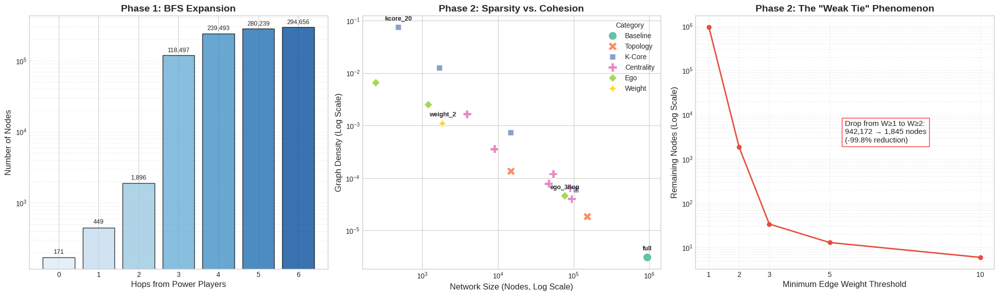

In [ ]:
# Then we parse the logfiles for some plots:

def parse_depth_distribution(log_content):
    """Extract depth distribution from full_stats.txt"""
    pattern = r"Depth distribution: \{([^}]+)\}"
    match = re.search(pattern, log_content)
    if match:
        depth_str = match.group(1)
        depth_data = {}
        for item in depth_str.split(','):
            key, val = item.split(':')
            depth_data[int(key.strip())] = int(val.strip())
        return depth_data
    return {}

def parse_subgraph_table(log_content):
    """Extract subgraph comparison table from subgraph_const_log.txt"""
    # Find the summary table - it's a fixed-width format
    pattern = r"SUMMARY OF THRESHOLDING RESULTS\n={70}\n(.+?)\n={70}"
    match = re.search(pattern, log_content, re.DOTALL)
    
    if not match:
        return None
    
    table_text = match.group(1)
    lines = table_text.strip().split('\n')
    
    # Skip header line
    data_lines = [l for l in lines[1:] if l.strip()]
    data = []
    
    for line in data_lines:
        # Parse fixed-width format more carefully
        # Format: name(variable) nodes edges density pp_count retention rel_types
        parts = line.split()
        if len(parts) >= 7:
            name = parts[0]
            try:
                nodes = int(parts[1])
                edges = int(parts[2])
                density = float(parts[3])
                pp_count = int(parts[4])
                retention = float(parts[5])
                rel_types = int(parts[6])
            except ValueError:
                continue
            
            # Categorize (order matters!)
            if 'betweenness' in name or 'weighted_degree' in name:
                category = 'Centrality'
            elif name.startswith('weight_'):
                category = 'Weight'
            elif 'kcore' in name:
                category = 'K-Core'
            elif 'ego' in name:
                category = 'Ego'
            elif 'reltype' in name:
                category = 'Topology'
            else:
                category = 'Baseline'
            
            data.append((name, nodes, edges, pp_count, retention, rel_types, category))
    
    df = pd.DataFrame(data, columns=['Name', 'Nodes', 'Edges', 'PP', 'Retention', 'UniqueRelTypes', 'Category'])
    df['Density'] = (2 * df['Edges']) / (df['Nodes'] * (df['Nodes'] - 1))
    return df

# ==========================================
# LOAD AND PARSE LOG FILES
# ==========================================

print("Loading log files...")
with open('full_stats.txt', 'r', encoding='utf-8') as f:
    full_stats_log = f.read()

with open('subgraph_const_log.txt', 'r', encoding='utf-8') as f:
    subgraph_log = f.read()

# Parse data
depth_data = parse_depth_distribution(full_stats_log)
df = parse_subgraph_table(subgraph_log)

# Extract weight sensitivity specifically
df_weight = df[df['Category'] == 'Weight'].copy()

# Build weight sensitivity dataframe
weight_data = [[1, df[df['Name'] == 'full']['Nodes'].values[0]]]  # implicit weight≥1

for _, row in df_weight.iterrows():
    thresh = int(row['Name'].split('_')[1])
    weight_data.append([thresh, row['Nodes']])

df_weight_full = pd.DataFrame(weight_data, columns=['Threshold', 'Nodes'])
df_weight_full = df_weight_full.sort_values('Threshold').reset_index(drop=True)

print(f"Categories: {df['Category'].value_counts().to_dict()}")

# ==========================================
# PLOTTING
# ==========================================
plt.style.use('seaborn-v0_8-whitegrid')
fig = plt.figure(figsize=(20, 6))
gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 1])

# Panel 1: BFS Expansion
ax1 = fig.add_subplot(gs[0])
colors_depth = sns.color_palette("Blues", len(depth_data))
bars = ax1.bar(list(depth_data.keys()), list(depth_data.values()), 
               color=colors_depth, edgecolor='black', alpha=0.8)
ax1.set_xlabel('Hops from Power Players', fontsize=12)
ax1.set_ylabel('Number of Nodes', fontsize=12)
ax1.set_title('Phase 1: BFS Expansion', fontsize=14, fontweight='bold')
ax1.set_yscale('log')
ax1.grid(True, which='both', axis='y', linestyle='--', alpha=0.3)
ax1.bar_label(bars, fmt='{:,.0f}', padding=3, fontsize=9)

# Panel 2: Density vs Network Size
ax2 = fig.add_subplot(gs[1])
df_scatter = df[df['Nodes'] > 100]
sns.scatterplot(data=df_scatter, x='Nodes', y='Density', hue='Category', 
                style='Category', s=150, ax=ax2, palette='Set2')
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.set_title('Phase 2: Sparsity vs. Cohesion', fontsize=14, fontweight='bold')
ax2.set_ylabel('Graph Density (Log Scale)', fontsize=12)
ax2.set_xlabel('Network Size (Nodes, Log Scale)', fontsize=12)

# Annotate key outliers
for i, row in df_scatter.iterrows():
    if row['Name'] in ['kcore_20', 'ego_3hop', 'full', 'weight_2']:
        ax2.annotate(row['Name'], (row['Nodes'], row['Density']), 
                     xytext=(0, 10), textcoords='offset points', 
                     ha='center', fontsize=9, fontweight='bold')

# Panel 3: Weight Sensitivity
ax3 = fig.add_subplot(gs[2])
ax3.plot(df_weight_full['Threshold'], df_weight_full['Nodes'], 
         marker='o', linewidth=2, color='#e74c3c')
ax3.set_yscale('log')
ax3.set_title('Phase 2: The "Weak Tie" Phenomenon', fontsize=14, fontweight='bold')
ax3.set_xlabel('Minimum Edge Weight Threshold', fontsize=12)
ax3.set_ylabel('Remaining Nodes (Log Scale)', fontsize=12)
ax3.set_xticks(df_weight_full['Threshold'].values)
ax3.grid(True, which='both', linestyle='--', alpha=0.3)

# Insight text
if len(df_weight_full) >= 2:
    w1_nodes = df_weight_full.iloc[0]['Nodes']
    w2_nodes = df_weight_full.iloc[1]['Nodes']
    w2_thresh = df_weight_full.iloc[1]['Threshold']
    pct_drop = ((w1_nodes - w2_nodes) / w1_nodes) * 100
    
    insight_text = (
        f"Drop from W≥1 to W≥{int(w2_thresh)}:\n"
        f"{int(w1_nodes):,} → {int(w2_nodes):,} nodes\n"
        f"(-{pct_drop:.1f}% reduction)"
    )
else:
    insight_text = "Insufficient weight\nthreshold data"
    
ax3.text(0.5, 0.5, insight_text, transform=ax3.transAxes, 
         bbox=dict(facecolor='white', alpha=0.8, edgecolor='red'), fontsize=11)

plt.tight_layout()
plt.savefig('network_behavior_analysis.png', dpi=150, bbox_inches='tight')

# Summary statistics
print("\n" + "="*70)
print("DATA SUMMARY")
print("="*70)
print("\nWeight Sensitivity:")
print(df_weight_full.to_string(index=False))
print("\nDensity Extremes:")
print(df_scatter.sort_values('Density', ascending=False)[['Name', 'Nodes', 'Density']].head(3).to_string(index=False))
print("\nRelational Diversity:")
print(df.sort_values('UniqueRelTypes', ascending=False)[['Name', 'UniqueRelTypes']].head(3).to_string(index=False))

##### And the pre-generated figures that we would get from Step 4.0

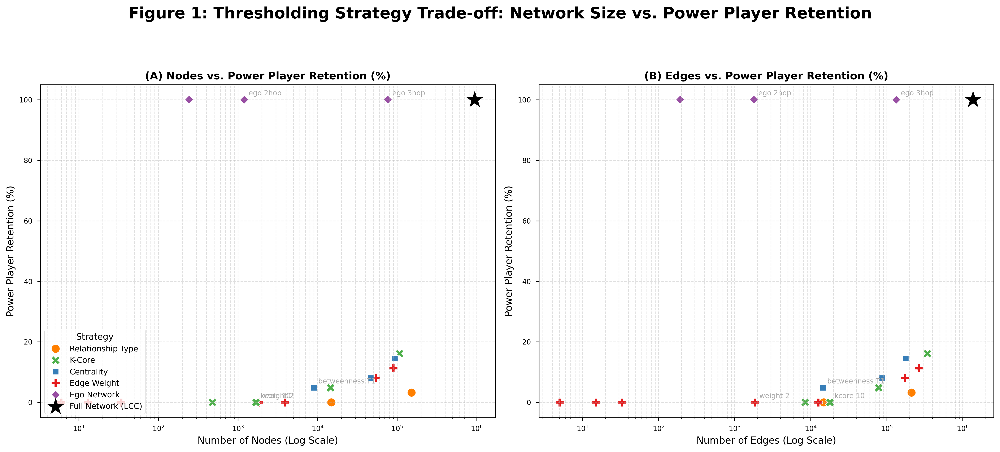
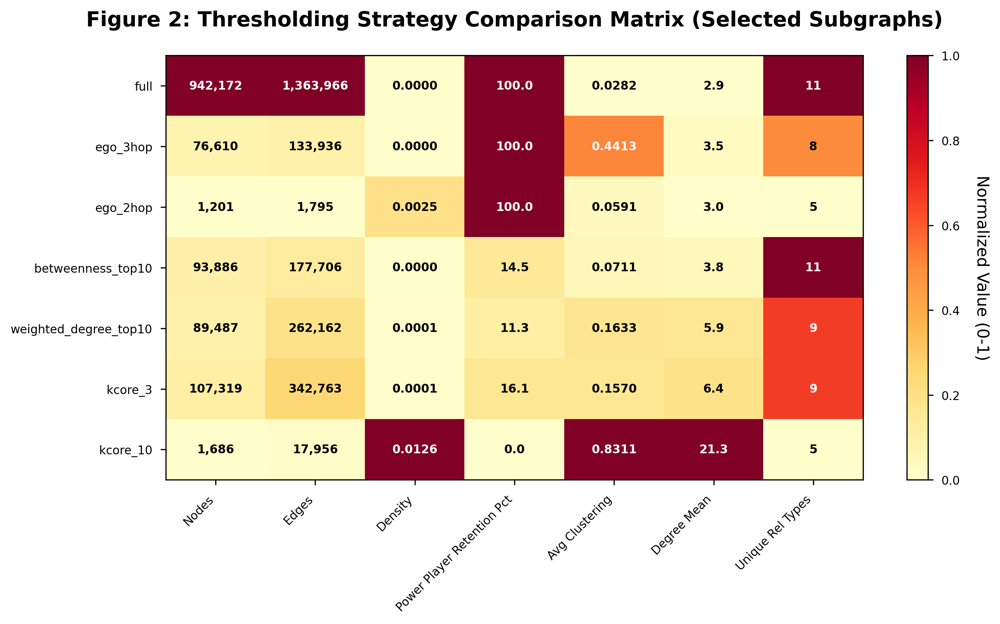
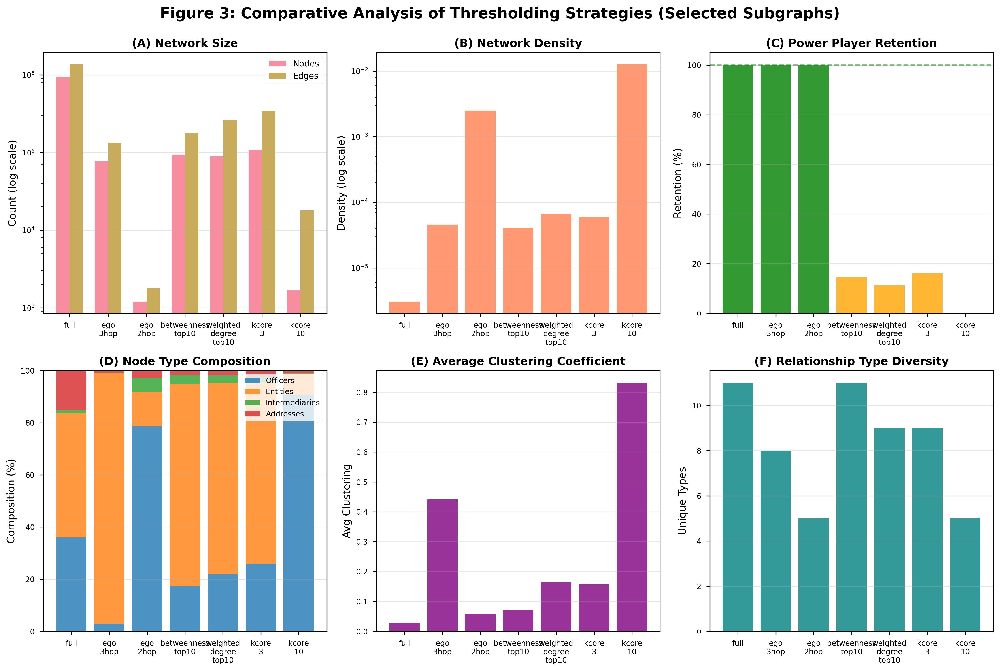
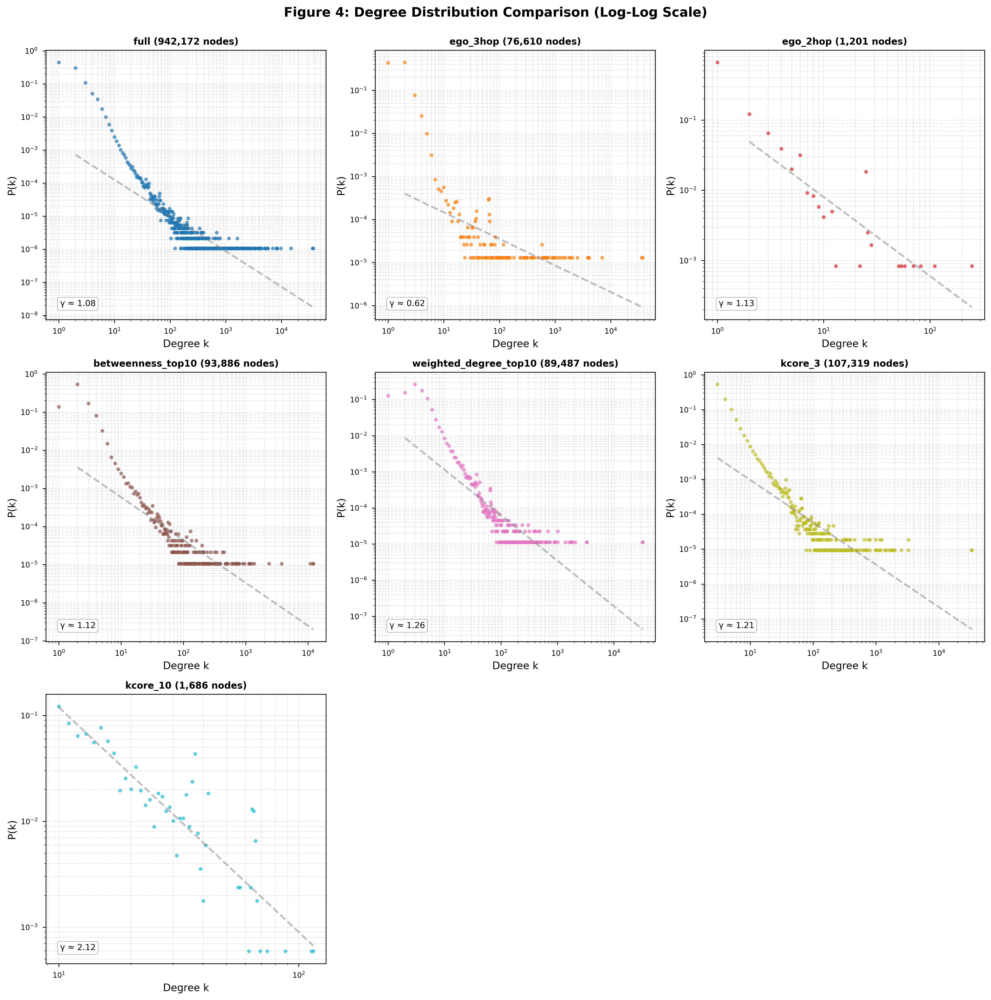
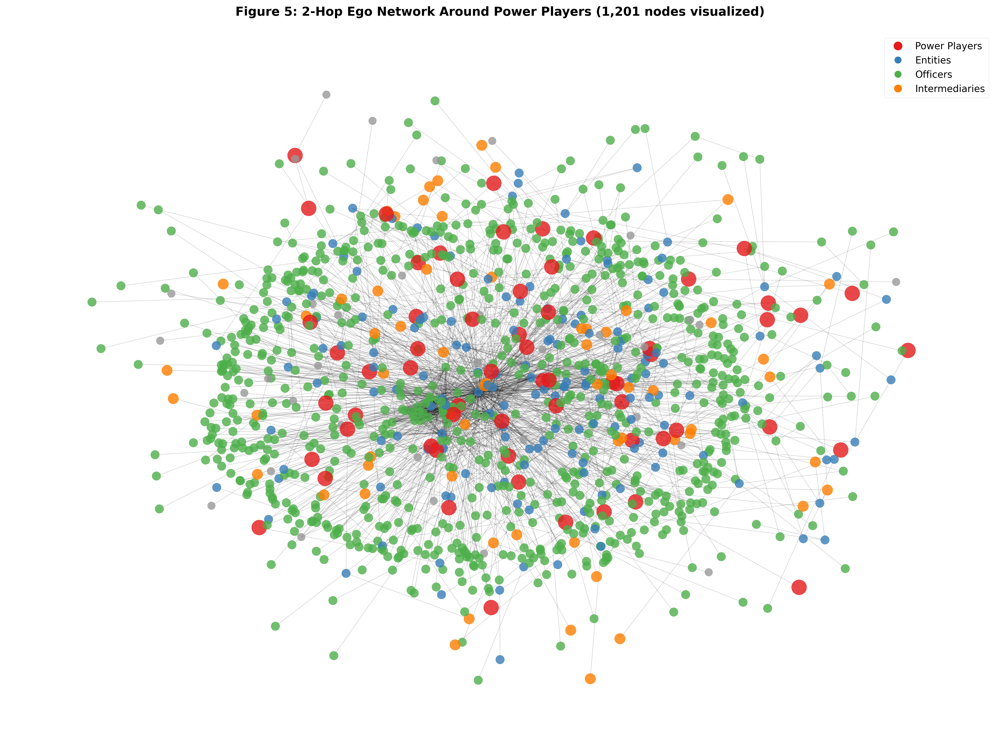
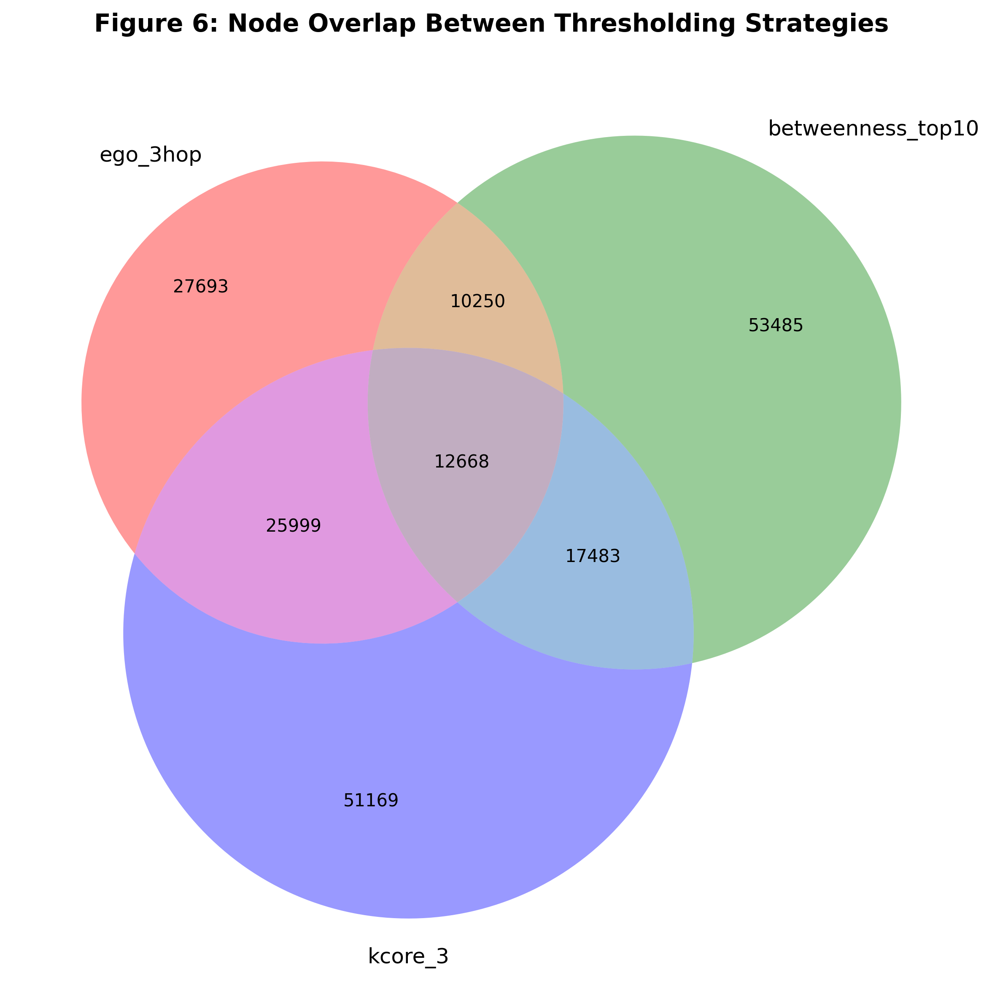
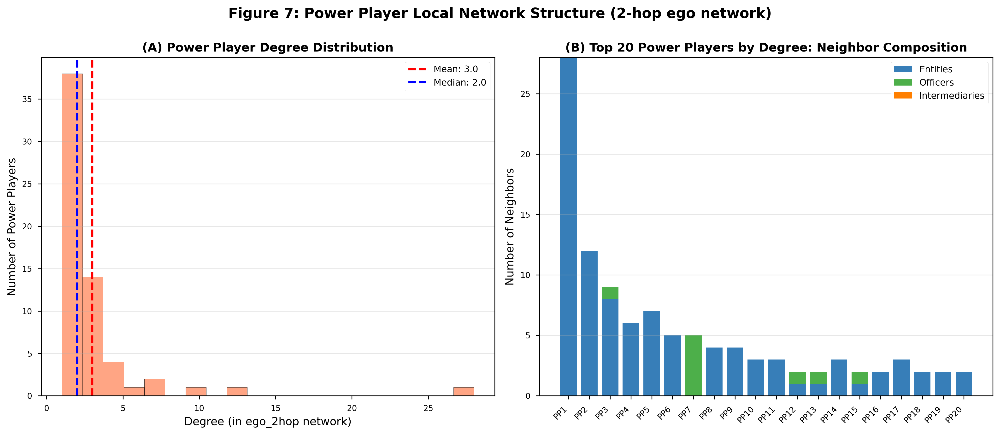